# Análise de Sobrevivência de Pacientes com Carcinoma Hepatocelular (HCC)

## Introdução

Este projeto tem como objetivo desenvolver um pipeline de aprendizagem computacional capaz de prever a sobrevivência de pacientes com carcinoma hepatocelular (HCC) um ano após o diagnóstico. Utilizando um conjunto de dados contendo informações clínicas e laboratoriais dos pacientes, aplicamos diversas técnicas de pré-processamento, visualização de dados e modelagem preditiva para alcançar este objetivo.

## Objetivo

O objetivo principal deste trabalho é construir um modelo preditivo que classifique os pacientes em duas categorias: "Vive" ou "Morre" um ano após o diagnóstico de HCC. Para isso, seguimos os seguintes passos:

1. **Carregamento e Pré-processamento dos Dados**: Imputação de valores ausentes, normalização e codificação de variáveis.
2. **Análise Exploratória dos Dados (EDA)**: Visualização dos dados para entender melhor as distribuições e relações entre as variáveis.
3. **Treinamento de Modelos de Machine Learning**: Treinamento de diversos modelos, incluindo SVM, Naive Bayes e Regressão Logística.
4. **Avaliação dos Modelos**: Avaliação dos modelos utilizando métricas de desempenho como acurácia, precisão, recall e F1-score.
5. **Seleção do Melhor Modelo**: Seleção do modelo com melhor desempenho para previsões futuras.

## Estrutura do Notebook

1. **Carregamento e Pré-processamento dos Dados**
2. **Análise Exploratória dos Dados (EDA)**
3. **Treinamento e Avaliação de Modelos**
4. **Visualização dos Resultados**
5. **Conclusão e Próximos Passos**

Vamos começar!


## Carregamento e Perfilamento dos Dados

Nesta seção, carregamos o conjunto de dados e geramos um relatório de perfilamento utilizando a biblioteca `pandas_profiling`. Este relatório fornece uma visão geral do conjunto de dados, incluindo:

- Estatísticas descritivas
- Valores ausentes
- Alertas e perceções gerais sobre a natureza dos dados

O objetivo é identificar possíveis problemas e entender melhor a estrutura dos dados antes de prosseguir com a análise exploratória e a modelagem preditiva. O relatório será exibido diretamente no notebook para facilitar a visualização.

In [3]:
import pandas as pd
from pandas_profiling import ProfileReport

# Carregar o conjunto de dados
hcc_data = pd.read_csv('hcc_dataset.csv')

# Gerar um relatório de perfilamento dos dados
# O pandas_profiling gera um relatório que inclui estatísticas descritivas,
# distribuições de variáveis, e muito mais
profile = ProfileReport(hcc_data, title="Profiling Report", html={'style':{'full_width':True}})

profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Carregamento dos Dados e Estatísticas Descritivas

Nesta seção, carregamos o conjunto de dados e geramos estatísticas descritivas para entender melhor a distribuição e as características das variáveis. As estatísticas descritivas incluem medidas como média, desvio padrão, valores mínimos e máximos, e quartis. 

Essas informações são essenciais para no futuro identificar possíveis problemas nos dados, como valores aberrantes /outliers, e para obter uma visão geral das características dos pacientes com carcinoma hepatocelular (HCC).

In [7]:
hcc_data = pd.read_csv('hcc_dataset.csv', na_values=['?'])
hcc_data.describe()

,Age,Grams_day,Packs_year,INR,AFP,Hemoglobin,MCV,Leucocytes,Platelets,Albumin,...,GGT,ALP,TP,Creatinine,Nodules,Major_Dim,Dir_Bil,Iron,Sat,Ferritin
count,165.000000,117.000000,112.000000,161.000000,1.570000e+02,162.000000,162.000000,162.000000,162.000000,159.000000,...,162.000000,162.000000,154.000000,158.000000,163.000000,145.000000,121.000000,86.000000,85.000000,85.000000
mean,64.690909,71.008547,20.464286,1.421851,1.929995e+04,12.879012,95.119753,1473.961549,113206.442654,3.445535,...,268.026543,212.211605,8.961039,1.127089,2.736196,6.851172,1.930000,85.598837,37.028941,438.997647
std,13.319534,76.277680,51.565130,0.477816,1.490983e+05,2.145237,8.405846,2909.106006,107118.632481,0.685132,...,258.750319,167.943548,11.728739,0.955856,1.797901,5.095042,4.210452,55.698995,28.993552,457.114454
min,20.000000,0.000000,0.000000,0.840000,1.200000e+00,5.000000,69.500000,2.200000,1.710000,1.900000,...,23.000000,1.280000,3.900000,0.200000,0.000000,1.500000,0.100000,0.000000,0.000000,0.000000
25%,57.000000,0.000000,0.000000,1.170000,5.200000e+00,11.425000,89.775000,5.100000,255.750000,3.000000,...,91.250000,108.250000,6.300000,0.700000,1.000000,3.000000,0.370000,40.500000,16.000000,84.000000
50%,66.000000,75.000000,0.000000,1.300000,3.300000e+01,13.050000,94.950000,7.200000,93000.000000,3.400000,...,179.500000,162.000000,7.050000,0.850000,2.000000,5.000000,0.700000,83.000000,27.000000,295.000000
75%,74.000000,100.000000,30.500000,1.530000,6.150000e+02,14.600000,100.675000,19.525000,171500.000000,4.050000,...,345.250000,261.500000,7.575000,1.100000,5.000000,9.000000,1.400000,118.000000,56.000000,706.000000
max,93.000000,500.000000,510.000000,4.820000,1.810346e+06,18.700000,119.600000,13000.000000,459000.000000,4.900000,...,1575.000000,980.000000,102.000000,7.600000,5.000000,22.000000,29.300000,224.000000,126.000000,2230.000000


## Análise da Assimetria das Variáveis Numéricas

### O que é Skewness?

A skewness é uma medida de simetria ou assimetria na distribuição dos dados. Ela indica o grau de distorção em relação a uma distribuição normal (gaussiana). Em outras palavras, a skewness indica se a distribuição dos dados é simétrica ou assimétrica em relação à sua média.

1. **Skewness Positiva (Assimetria à Direita)**: Quando a cauda da distribuição se estende mais para a direita (valores mais altos) em relação à média. Nesse caso, a média é maior que a mediana.

2. **Skewness Negativa (Assimetria à Esquerda)**: Quando a cauda da distribuição se estende mais para a esquerda (valores mais baixos) em relação à média. Nesse caso, a média é menor que a mediana.
- **Skewness próxima de zero**: Indica que a distribuição é quase simétrica em relação à média, como na distribuição normal.

### Por que devemos analisar a skewness?

Analisar a skewness das variáveis é importante por várias razões:

1. **Identificação de Outliers**: Distribuições com alta skewness podem indicar a presença de outliers, que são valores extremos que se desviam significativamente da tendência central dos dados.

2. **Seleção de Técnicas Estatísticas**: Muitas técnicas estatísticas, como testes de hipóteses e modelos de regressão, assumem que os dados seguem uma distribuição normal ou simétrica. Se os dados apresentarem alta skewness (tanto positiva como negativa), pode ser necessário aplicar transformações(como logaritmo ou raiz quadrada) para aproximar a distribuição de uma normal ou então utilizar técnicas não paramétricas. Isso pode melhorar a performance dos modelos de machine learning.

3. **Interpretação dos Resultados**: A skewness pode afetar a interpretação de medidas de tendência central, como a média e a mediana. Em distribuições assimétricas, a mediana pode ser uma medida de tendência central mais representativa do que a média.

4. **Modelagem e Previsão**: Em alguns casos, a skewness pode ser um indicador de um processo subjacente ou de um padrão nos dados. Compreender a skewness pode ajudar a construir modelos mais precisos e fazer previsões mais confiáveis.

Ao analisar a skewness dos dados, é importante considerar o contexto e o domínio do problema. Em alguns casos, a skewness pode ser esperada e não representar um problema. Em outros casos, pode ser necessário aplicar transformações ou técnicas específicas para lidar com a assimetria.

Em resumo, a skewness é uma medida importante na análise de dados, pois fornece informações sobre a forma da distribuição e pode influenciar a escolha de técnicas estatísticas, a interpretação dos resultados e a construção de modelos mais precisos.

Vamos calcular a skewness das variáveis numéricas do nosso conjunto de dados.

In [33]:
# Carregar o conjunto de dados
hcc_data = pd.read_csv('hcc_dataset.csv', na_values=['?'])

# Selecionar apenas as variáveis numéricas
numeric_data = hcc_data.select_dtypes(include=[np.number])

# Calcular a skewness de cada variável numérica
skewness = numeric_data.skew()
print("Skewness/Assimetria de cada variável numérica:")
print(skewness)

Skewness/Assimetria de cada variável numérica:
Age           -0.779988
Grams_day      1.986666
Packs_year     7.886234
INR            3.587974
AFP           11.392308
Hemoglobin    -0.441710
MCV           -0.087315
Leucocytes     1.865177
Platelets      0.950930
 Albumin      -0.102843
Total_Bil      4.522439
ALT            2.619456
AST            2.721387
GGT            2.105514
ALP            2.317649
TP             6.111737
Creatinine     4.060195
Nodules        0.318755
Major_Dim      1.198030
Dir_Bil        4.616666
Iron           0.619699
Sat            0.952659
Ferritin       1.798995
dtype: float64


## Visualização da Distribuição da Idade

Nesta seção, criamos um histograma para visualizar a distribuição da idade dos pacientes com carcinoma hepatocelular (HCC). Utilizamos a biblioteca Seaborn para gerar o histograma e a densidade kernel (KDE), que nos ajuda a entender melhor a distribuição dos dados. Queremos com isto uma visão mais intuitiva e compreensível da distribuição da idade, o que nos é útil para a análise exploratória dos dados.

Vamos criar o histograma da idade dos pacientes.

c:\Users\Gabriel\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


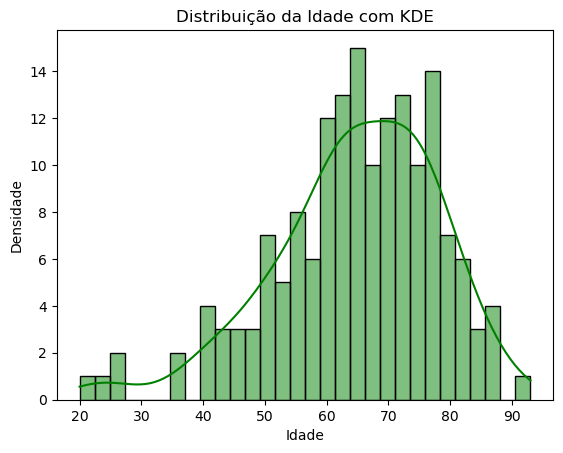

In [8]:
# Histograma da idade com Seaborn
import seaborn as sb
import matplotlib.pyplot as plt
sb.histplot(hcc_data['Age'].dropna(), bins=30, kde=True, color='green')
plt.title('Distribuição da Idade com KDE')
plt.xlabel('Idade')
plt.ylabel('Densidade')
plt.show()

## Visualização das Variáveis Numéricas com Violin Plots

Violin plots são gráficos que mostram a distribuição de dados em diferentes níveis de uma variável categórica. Eles são semelhantes aos box plots, mas incluem também uma estimativa de densidade, o que lhes dá uma forma mais intuitiva e até artística de visualizar relações entre dados. Aqui, utilizamos violin plots para visualizar a distribuição das variáveis numéricas em relação à variável alvo 'Class' (Lives ou Dies).

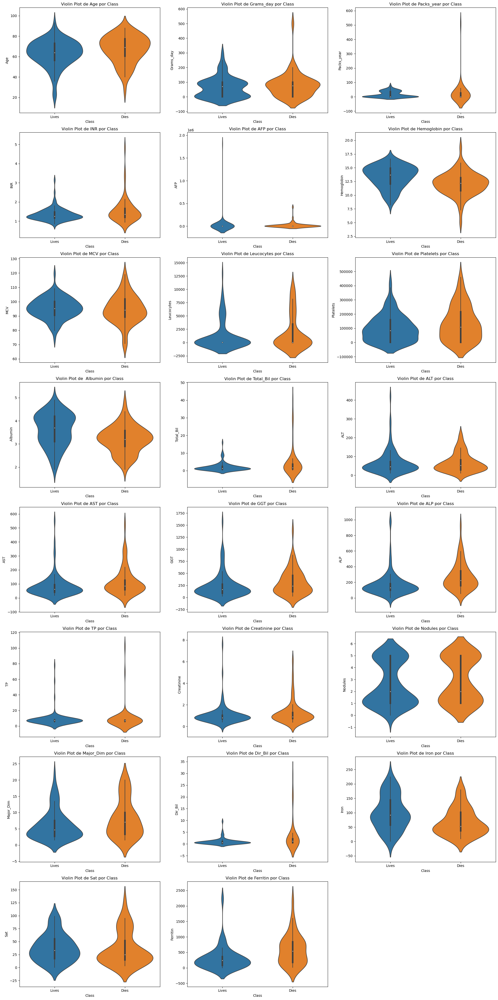

In [32]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Carregar o conjunto de dados
hcc_data = pd.read_csv('hcc_dataset.csv', na_values=['?'])

# Codificar a variável alvo 'Class'
hcc_data['Class'] = hcc_data['Class'].replace({'Lives': 'Lives', 'Dies': 'Dies'})

# Selecionar apenas as variáveis numéricas
numeric_data = hcc_data.select_dtypes(include=[np.number])

# Adicionar a variável 'Class' ao DataFrame de dados numéricos
numeric_data['Class'] = hcc_data['Class']

# Configurar o tamanho da figura e a grade de subplots
num_vars = len(numeric_data.columns) - 1  # Excluir a coluna 'Class'
ncols = 3  # Número de colunas para os subplots
nrows = (num_vars + ncols - 1) // ncols  # Número de linhas necessárias

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 5 * nrows))
axs = axs.flatten()

# Iterar sobre cada variável numérica e criar um violin plot
for i, column in enumerate(numeric_data.columns[:-1]):  # Excluir a coluna 'Class'
    sns.violinplot(x='Class', y=column, data=numeric_data, ax=axs[i])
    axs[i].set_title(f'Violin Plot de {column} por Class')
    axs[i].set_ylabel(column)

# Remover subplots vazios
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

## Comparação de Idade e ALT com Coordenadas Polares

Criamos um gráfico de dispersão polar para visualizar a relação entre a idade dos pacientes (Age) e os níveis de Alanina Aminotransferase (ALT). Utilizamos coordenadas polares para transformar a idade em ângulos e os níveis de ALT em raios.

## Gráfico de Dispersão Polar

O gráfico de dispersão polar é uma técnica de visualização útil quando se deseja explorar a relação entre duas variáveis, e uma das quais é cíclica ou periódica. Neste caso, utilizamos um gráfico de dispersão polar para visualizar a relação entre a idade dos pacientes (Age) e os níveis de Alanina Aminotransferase (ALT).

Ao transformar a idade em ângulos no sistema de coordenadas polares, podemos representar a natureza cíclica dessa variável de forma mais adequada. Cada ângulo no gráfico de dispersão polar corresponde a uma idade específica, e os pontos de dados são plotados radialmente com base nos níveis de ALT.

Essa abordagem oferece várias vantagens:

1. **Visualização da Natureza Cíclica**: O gráfico de dispersão polar permite visualizar a natureza cíclica da idade, evitando a separação artificial de pontos de dados próximos em idades extremas (por exemplo, 20 e 70 anos).

2. **Identificação de Padrões**: Ao plotar os dados em coordenadas polares, é possível identificar padrões circulares ou radiais que podem indicar relações interessantes entre a idade e os níveis de ALT.

3. **Detecção de Outliers**: Outliers ou observações atípicas podem ser facilmente identificados no gráfico de dispersão polar, pois se destacam como pontos distantes do padrão geral.

4. **Análise de Tendências**: O gráfico de dispersão polar pode revelar tendências ou variações nos níveis de ALT em relação à idade, o que pode ser útil para identificar faixas etárias de risco ou padrões de saúde específicos.



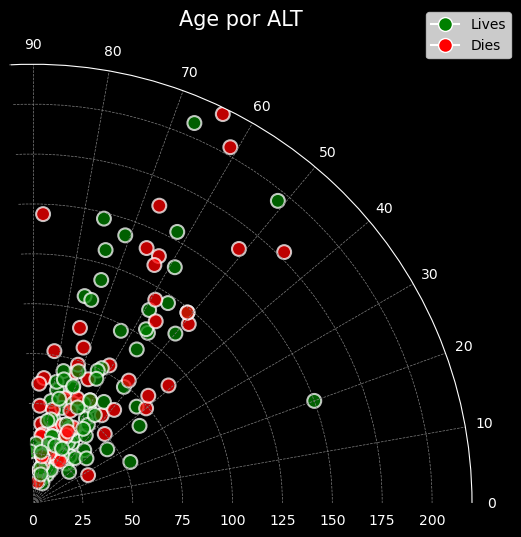

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Carregar o conjunto de dados
hcc_data = pd.read_csv('hcc_dataset.csv', na_values=['?'])

# Selecionar as colunas 'Age', 'ALT' e 'Class' e remover linhas com valores ausentes em qualquer uma das colunas
data = hcc_data[['Age', 'ALT', 'Class']].dropna()

# Converter os dados para coordenadas polares
theta = np.deg2rad(data['Age'])  # Converter idade para radianos
r = data['ALT']  # ALT como raio

# Mapear as classes para cores
class_colors = {'Lives': 'green', 'Dies': 'red'}
colors = data['Class'].map(class_colors)

# Criar o gráfico de dispersão polar
fig = plt.figure(figsize=(8, 6), facecolor='black')
ax = fig.add_subplot(111, polar=True, facecolor='black')
scatter = ax.scatter(theta, r, c=colors, alpha=0.75, edgecolors='white', s=100, linewidth=1.5)

# Personalizar a visualização
ax.set_title('Age por ALT', va='bottom', color='white', fontsize=15)
ax.grid(color='gray', linestyle='--', linewidth=0.5)
ax.tick_params(colors='white')
ax.spines['polar'].set_color('white')

# Ajustar os limites do gráfico para mostrar apenas até aos 93 anos(máximo)
ax.set_thetamin(0)
ax.set_thetamax(93)

# Ajustar os limites do gráfico
ax.set_ylim(0, 220)

# Adicionar rótulos de idade nos ângulos correspondentes
age_ticks = np.arange(0, 91, 10)
ax.set_xticks(np.deg2rad(age_ticks))
ax.set_xticklabels(age_ticks, color='white')

# Adicionar legenda
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label) 
           for label, color in class_colors.items()]
ax.legend(handles=handles, loc='upper right', bbox_to_anchor=(1.1, 1.1))

# Mostrar o gráfico
plt.show()

## Heatmap de Correlação das Variáveis Numéricas

Nesta seção, criamos um heatmap de correlação para visualizar as relações entre as variáveis numéricas do conjunto de dados. A correlação é uma medida estatística que indica a força e a direção do relacionamento linear entre duas variáveis.

### Por que Analisar a Correlação?

Analisar a correlação entre as variáveis é importante por várias razões:

1. **Identificação de Relações**: Ajuda a identificar relações fortes entre variáveis, o que pode ser útil para a construção de modelos preditivos.
2. **Redução de Dimensionalidade**: Variáveis altamente correlacionadas podem ser redundantes. Identificar essas variáveis pode ajudar a reduzir a dimensionalidade do conjunto de dados.
3. **Compreensão dos Dados**: Fornece uma visão geral das interações entre as variáveis, o que é essencial para a análise exploratória dos dados.

### Interpretação do Heatmap

- **Valores de Correlação**: Os valores de correlação variam de -1 a 1. Valores próximos de 1 indicam uma correlação positiva forte, valores próximos de -1 indicam uma correlação negativa forte, e valores próximos de 0 indicam pouca ou nenhuma correlação.
- **Máscara**: Aplicamos uma máscara para ocultar a parte superior direita do heatmap, pois a matriz de correlação é simétrica.

Vamos criar o heatmap de correlação para visualizar as relações entre as variáveis numéricas.

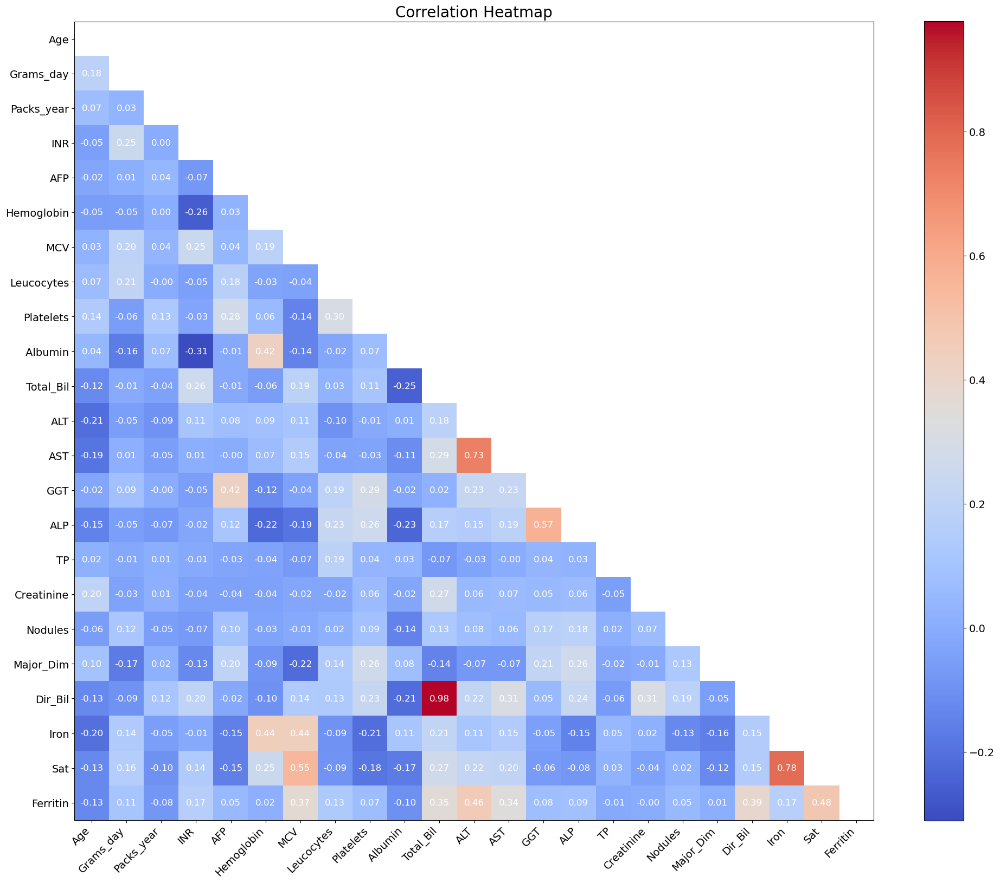

In [14]:
import matplotlib.pyplot as plt
import numpy as np

numeric_data = hcc_data.select_dtypes(include=[np.number])

# Calcular a matriz de correlação
corr = numeric_data.corr()
column_names = corr.columns

# Criar uma máscara para ocultar a parte superior direita do heatmap
mask = np.triu(np.ones_like(corr, dtype=bool))

# Aplicar a máscara à matriz de correlação
corr = np.ma.array(corr, mask=mask)  # Converte a matriz em uma matriz mascarada

fig, ax = plt.subplots(figsize=(20, 18))

im = ax.imshow(corr, cmap='coolwarm')

for i in range(len(corr)):
    for j in range(len(corr)):
        if not mask[i, j]:
            text = ax.text(j, i, f"{corr.data[i, j]:.2f}", ha="center", va="center", color="w", fontsize=12)

ax.set_xticks(np.arange(len(column_names)))
ax.set_yticks(np.arange(len(column_names)))
ax.set_xticklabels(column_names, rotation=45, ha="right", fontsize=14)
ax.set_yticklabels(column_names, fontsize=14)

# Adicionar uma barra de coloração
cbar = plt.colorbar(im, ax=ax, shrink=0.85)
cbar.ax.tick_params(labelsize=14)

plt.title('Correlation Heatmap', fontsize=20)

plt.tight_layout()

plt.show()

## Visualização das Relações entre Variáveis com Pairplots

Desta vez, vamos utilizar pairplots para visualizar as relações entre várias variáveis numéricas do conjunto de dados. Os pairplots são úteis para explorar as relações bivariadas entre variáveis e identificar padrões, tendências e possíveis outliers. Combinam-se gráficos de dispersão (scatter plots) para pares de variáveis e histogramas ou gráficos de densidade para a distribuição de cada variável individualmente.

c:\Users\Gabriel\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Gabriel\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Gabriel\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Gabriel\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before o

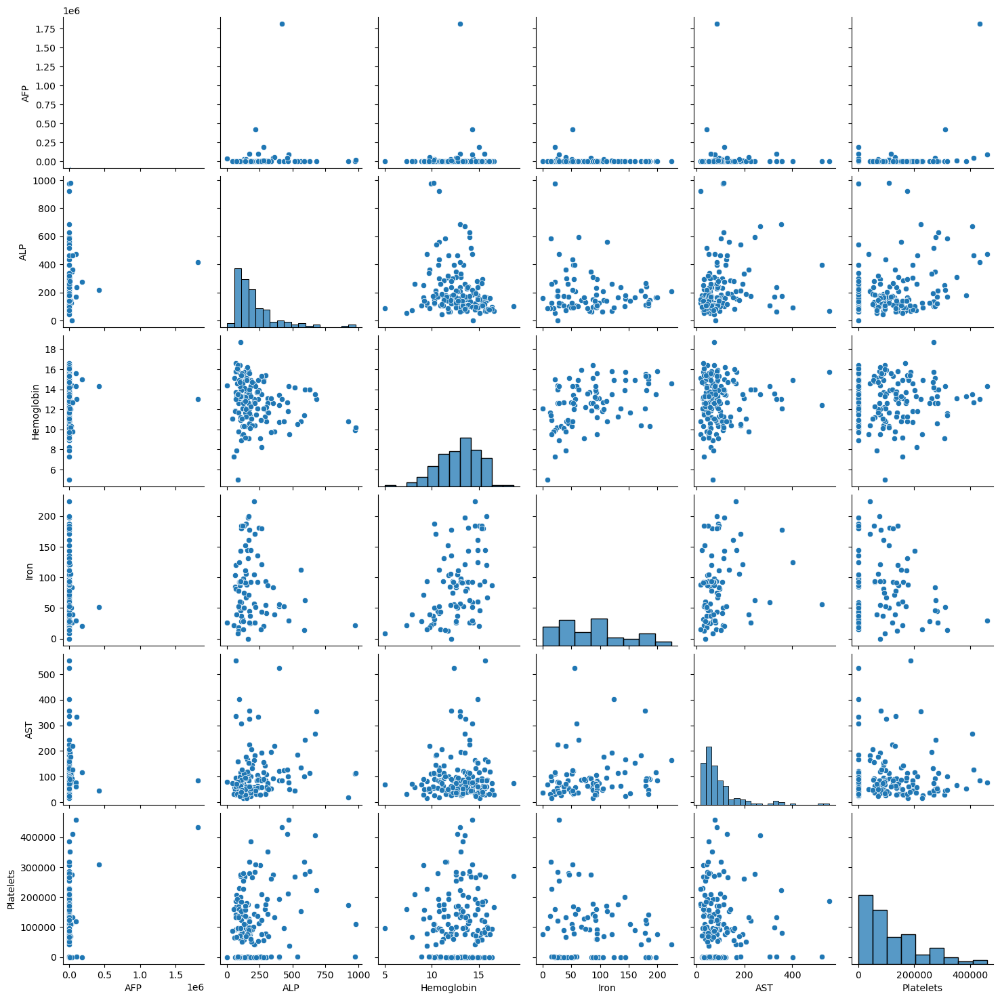

In [18]:
# Pairplot
sb.pairplot(hcc_data[['AFP', 'ALP', 'Hemoglobin', 'Iron', 'AST', 'Platelets']])
plt.show()

## Dados Ausentes

Variáveis com muitos valores ausentes podem precisar de atenção especial:

1. **Decisões de Imputação**: Queremos saber onde e como os valores ausentes estão distribuídos, o que nos pode orientar as decisões sobre como imputar ou lidar com esses valores.
2. **Qualidade dos Dados**: Avaliar a quantidade e a distribuição dos dados ausentes é essencial para garantir a qualidade dos dados e a robustez das análises subsequentes.

### Interpretação do Heatmap

- **Linhas**: Representam as observações (amostras) no conjunto de dados.
- **Colunas**: Representam as variáveis (características) no conjunto de dados.
- **Cores**: Indicam a presença (ou ausência) de valores ausentes. No heatmap, células amarelas indicam valores ausentes.

Eis o heatmap para visualizar os dados ausentes no conjunto de dados.

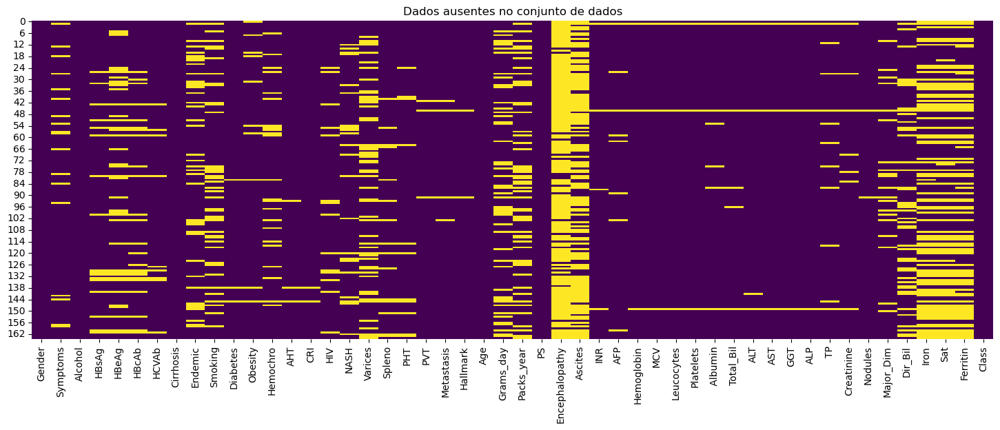

In [20]:
import seaborn as sb
import matplotlib.pyplot as plt

# Criando um heatmap para visualizar os dados ausentes
plt.figure(figsize=(18, 6))
sb.heatmap(hcc_data.isnull(), cbar=False, cmap='viridis')
plt.title('Dados ausentes no conjunto de dados')
plt.show()

## Boxplots para Detecção de Outliers

Nesta seção, utilizamos boxplots para visualizar a distribuição das variáveis numéricas e identificar possíveis outliers no conjunto de dados. Os boxplots são uma ferramenta gráfica útil para resumir a distribuição de um conjunto de dados.

### O que são Boxplots?

Boxplots, também conhecidos como gráficos de caixa, são gráficos que mostram a distribuição de um conjunto de dados com base em cinco estatísticas principais:

- **Mínimo**: O menor valor, excluindo outliers.
- **Primeiro Quartil (Q1)**: O valor abaixo do qual 25% dos dados estão situados.
- **Mediana (Q2)**: O valor central que divide os dados em duas metades iguais.
- **Terceiro Quartil (Q3)**: O valor abaixo do qual 75% dos dados estão situados.
- **Máximo**: O maior valor, excluindo outliers.



**Esta é a forma mais fácil de identificar outliers. Estes são representados como pontos individuais fora dos "bigodes" do boxplot.**

### Interpretação dos Boxplots

- **Caixa**: Representa o intervalo interquartil (IQR), que é a diferença entre o terceiro quartil (Q3) e o primeiro quartil (Q1).
- **Linha no Meio da Caixa**: Representa a mediana (Q2).
- **Bigodes**: Estendem-se até o valor mínimo e máximo dentro de 1.5 vezes o IQR a partir de Q1 e Q3, respectivamente.
- **Pontos Fora dos Bigodes**: Representam os outliers.

Siga criar boxplots para visualizar a distribuição das variáveis numéricas e identificar possíveis outliers.

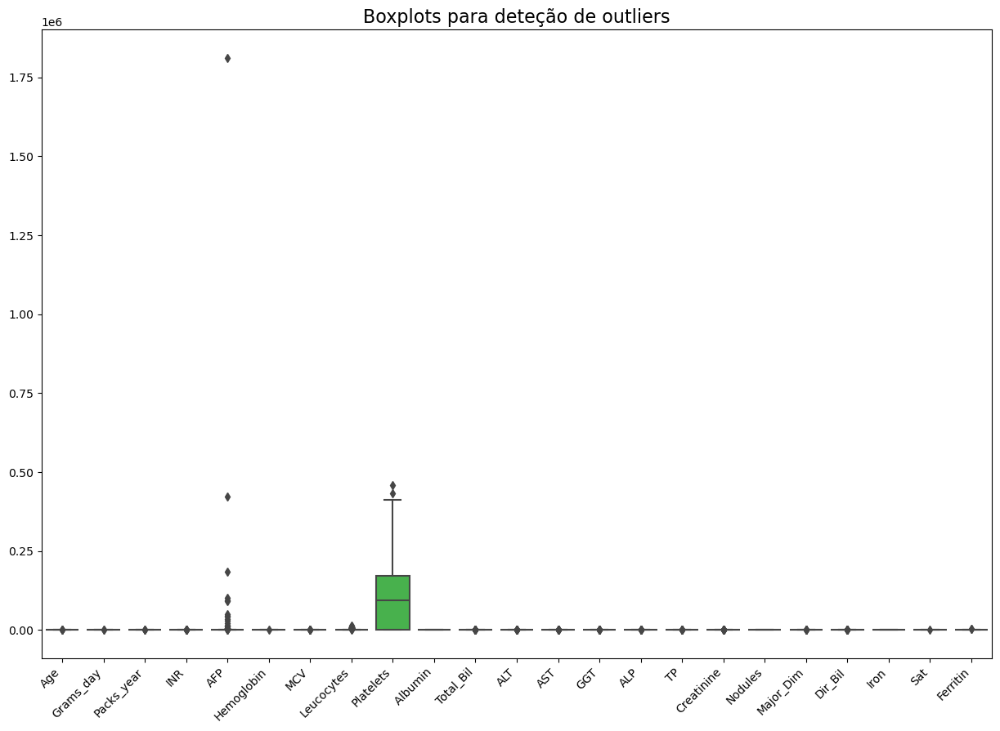

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt

# Selecionar apenas as variáveis numéricas
numeric_data = hcc_data.select_dtypes(include=[np.number])

# Criar um boxplot para cada variável numérica
plt.figure(figsize=(15, 10))
sns.boxplot(data=numeric_data)
plt.xticks(rotation=45, ha='right')
plt.title('Boxplots para deteção de outliers', fontsize=16)
plt.show()

## Nota sobre o Scatterplot Matrix (Pairplot)

Esta é uma ferramenta poderosa, cujo propósito é fornecer uma visão abrangente das relações entre múltiplas variáveis numéricas e a variável de classe de uma só vez.

No contexto deste trabalho, o scatterplot matrix permite-nos explorar as relações entre as diversas variáveis numéricas presentes no conjunto de dados de Carcinoma Hepatocelular (HCC), e através dessa visualização, podemos identificar potenciais associações entre variáveis clínicas, laboratoriais e demográficas, e como elas se relacionam com a classe de sobrevivência dos pacientes.

Através desta visualização podemos explorar as relações entre variáveis numéricas e a variável de classe num conjunto de dados complexo como o nosso. Ele permite-nos visualizar padrões, correlações e tendências que podem não ser aparentes em análises univariadas, fornecendo uma compreensão mais abrangente da estrutura dos dados e das interações entre as variáveis. Esta perspectiva multidimensional é essencial para orientar a seleção de variáveis, a construção de modelos preditivos e a geração de insights clinicamente relevantes.

['Lives_HCC' 'Dies_HCC']


c:\Users\Gabriel\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Gabriel\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Gabriel\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Gabriel\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before o

<Figure size 1200x1000 with 0 Axes>

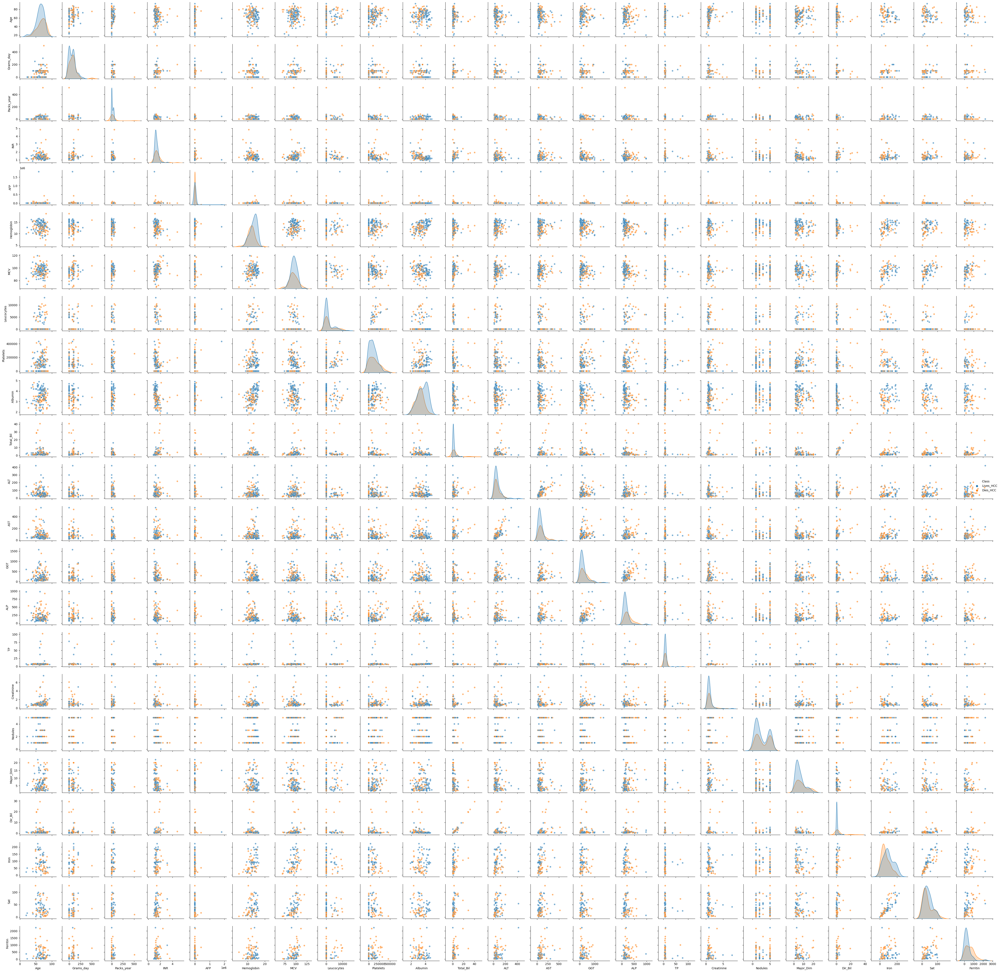

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Carregar o conjunto de dados
hcc_data = pd.read_csv('hcc_dataset.csv', na_values=['?'])

# Renomear a classe 'Dies' para 'Dies_HCC' e 'Lives' para 'Lives_HCC'
hcc_data.loc[hcc_data['Class'] == 'Dies', 'Class'] = 'Dies_HCC'
hcc_data.loc[hcc_data['Class'] == 'Lives', 'Class'] = 'Lives_HCC'

# Selecionar apenas as variáveis numéricas
numeric_cols = hcc_data.select_dtypes(include=[np.number]).columns

# Criar um subconjunto de dados com as colunas numéricas e a coluna 'Class'
data_subset = hcc_data[numeric_cols.tolist() + ['Class']]

# Criar o scatterplot matrix usando Seaborn
plt.figure(figsize=(12, 10))
sns.pairplot(data_subset, hue='Class', diag_kind='kde', plot_kws={'alpha': 0.6, 's': 30}, height=2)

# Ajustar espaçamento entre subplots
plt.tight_layout()

plt.show()

## Análise de Componentes Principais (PCA): 3D

A análise de componentes principais (PCA) é uma técnica de redução de dimensionalidade que nos permite visualizar e explorar dados de alta dimensão em um espaço de menor dimensão, mantendo uma boa fração da variância dos dados originais.

Neste trabalho, aplicamos o PCA em 3D para visualizar a estrutura subjacente dos dados de Carcinoma Hepatocelular (HCC) e explorar a relação entre as variáveis e a classe de sobrevivência dos pacientes.

### Interpretação dos Componentes Principais

Quando aplicamos o PCA, ele encontra as direções (vetores) ao longo das quais os dados variam mais. Essas direções são chamadas de componentes principais. A primeira componente principal é a direção de maior variância nos dados, a segunda componente principal é a direção de segunda maior variância, e assim por diante.
Após a redução de dimensionalidade com o PCA, as três primeiras componentes principais (PC1, PC2 e PC3) representam as três direções de maior variância nos dados originais. Isso significa que, se projetarmos os dados nessas três componentes principais, estaremos a preservar grande parte da informação (variância) presente nos dados originais.


Ao visualizar os dados nesse espaço tridimensional formado pelas três primeiras componentes principais, podemos observar como os dados se distribuem ao longo dessas direções de maior variância. Isso pode ajudar a identificar padrões, agrupamentos ou separação entre as classes nos dados.
Em resumo, as componentes principais representam as direções de maior variância nos dados após a redução de dimensionalidade, e projetar os dados nessas direções permite visualizar e capturar a maior parte da informação presente nos dados originais.




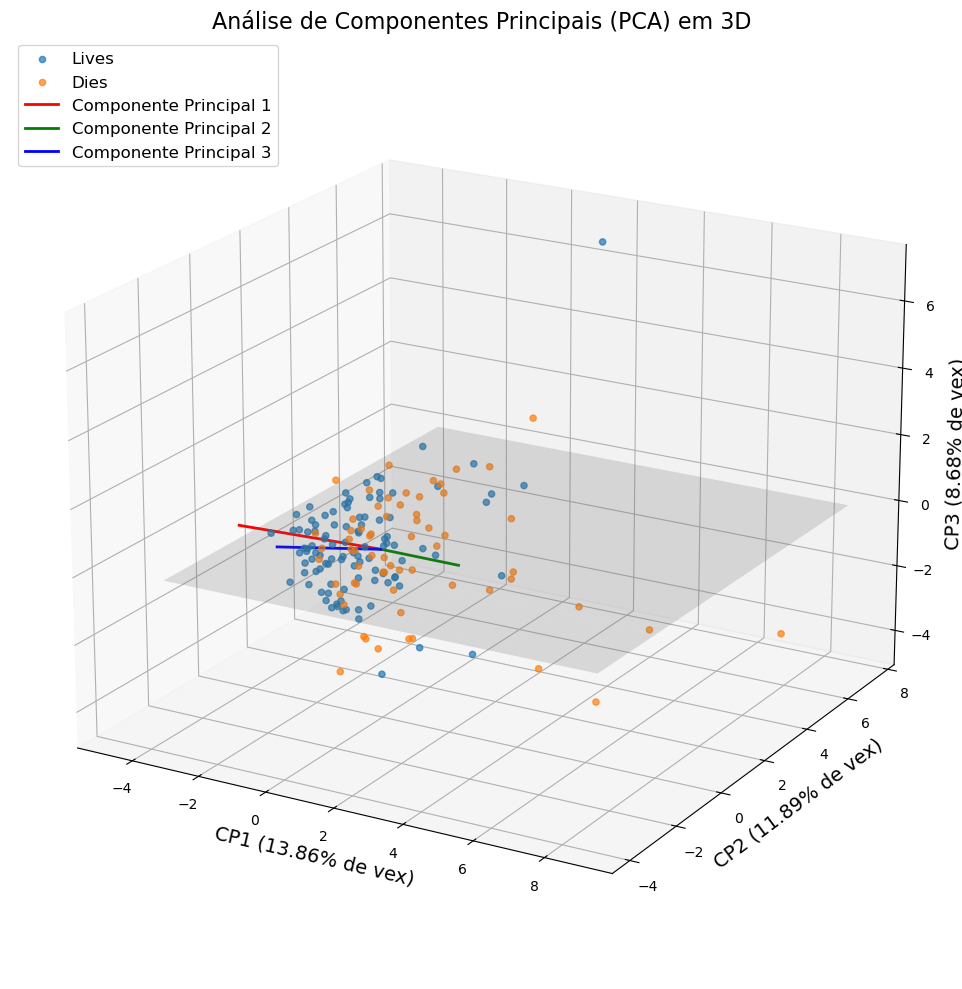

Variância explicada pelas três primeiras componentes principais: 34.43%


In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

# Carregamento do conjunto de dados
hcc_data = pd.read_csv('hcc_dataset.csv', na_values=['?'])

# Seleciona apenas as variáveis numéricas
numeric_data = hcc_data.select_dtypes(include=[np.number])

# Imputação os valores ausentes com a média
imputer = SimpleImputer(strategy='mean')
numeric_data_imputed = imputer.fit_transform(numeric_data)

# Normalização dos dados
scaler = StandardScaler()
scaled_data = scaler.fit_transform(numeric_data_imputed)

# Aplicação do PCA
pca = PCA(n_components=3)
pca_result = pca.fit_transform(scaled_data)

# Traçado dos resultados do PCA em 3D
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
for class_label in ['Lives', 'Dies']:
    mask = hcc_data['Class'].dropna() == class_label
    ax.scatter(pca_result[mask, 0], pca_result[mask, 1], pca_result[mask, 2], label=class_label, alpha=0.7)

# Mapeamento do plano principal
x_min, x_max = ax.get_xlim()
y_min, y_max = ax.get_ylim()
z_min, z_max = ax.get_zlim()
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 10), np.linspace(y_min, y_max, 10))
zz = np.zeros_like(xx)
ax.plot_surface(xx, yy, zz, alpha=0.2, color='gray')

# Marcação das direções principais
ax.plot([0, pca.components_[0, 0]*32], [0, pca.components_[0, 1]*8], [0, pca.components_[0, 2]*8], 'r-', linewidth=2, label='Componente Principal 1')
ax.plot([0, pca.components_[1, 0]*64], [0, pca.components_[1, 1]*8], [0, pca.components_[1, 2]*8], 'g-', linewidth=2, label='Componente Principal 2')
ax.plot([0, pca.components_[2, 0]*32], [0, pca.components_[2, 1]*8], [0, pca.components_[2, 2]*8], 'b-', linewidth=2, label='Componente Principal 3')
ax.set_title('Análise de Componentes Principais (PCA) em 3D', fontsize=16)
ax.set_xlabel('CP1 ({:.2f}% de vex)'.format(pca.explained_variance_ratio_[0]*100), fontsize=14)
ax.set_ylabel('CP2 ({:.2f}% de vex)'.format(pca.explained_variance_ratio_[1]*100), fontsize=14)
ax.set_zlabel('CP3 ({:.2f}% de vex)'.format(pca.explained_variance_ratio_[2]*100), fontsize=14)
ax.legend(loc='upper left', fontsize=12)

# Ajuste da visualização do eixo z
ax.view_init(elev=20, azim=-60)
plt.tight_layout()
plt.show()

# Imprime a variância explicada
print(f"Variância explicada pelas três primeiras componentes principais: {sum(pca.explained_variance_ratio_[:3])*100:.2f}%")

### PCA em 2D com Classificação SVM

Em seguida, aplicamos a PCA para reduzir os dados a duas componentes principais e utilizamos um classificador SVM (Máquina de Vetores de Suporte) para classificar os dados. Visualizamos as regiões de decisão do SVM num gráfico 2D.



### Interpretação dos Resultados

- **Componentes Principais (CP)**: As componentes principais são combinações lineares das variáveis originais que capturam a maior parte da variância nos dados.
- **Regiões de Decisão do SVM**: As regiões coloridas no gráfico 2D representam as áreas onde o classificador SVM prevê cada classe. A cor de cada ponto indica a classe real dos dados.

A PCA permite-nos reduzir a dimensionalidade dos dados, facilitando a visualização e a interpretação. A combinação da PCA com um classificador SVM nos permite explorar como as diferentes classes se distribuem nas componentes principais e avaliar a eficácia do classificador.

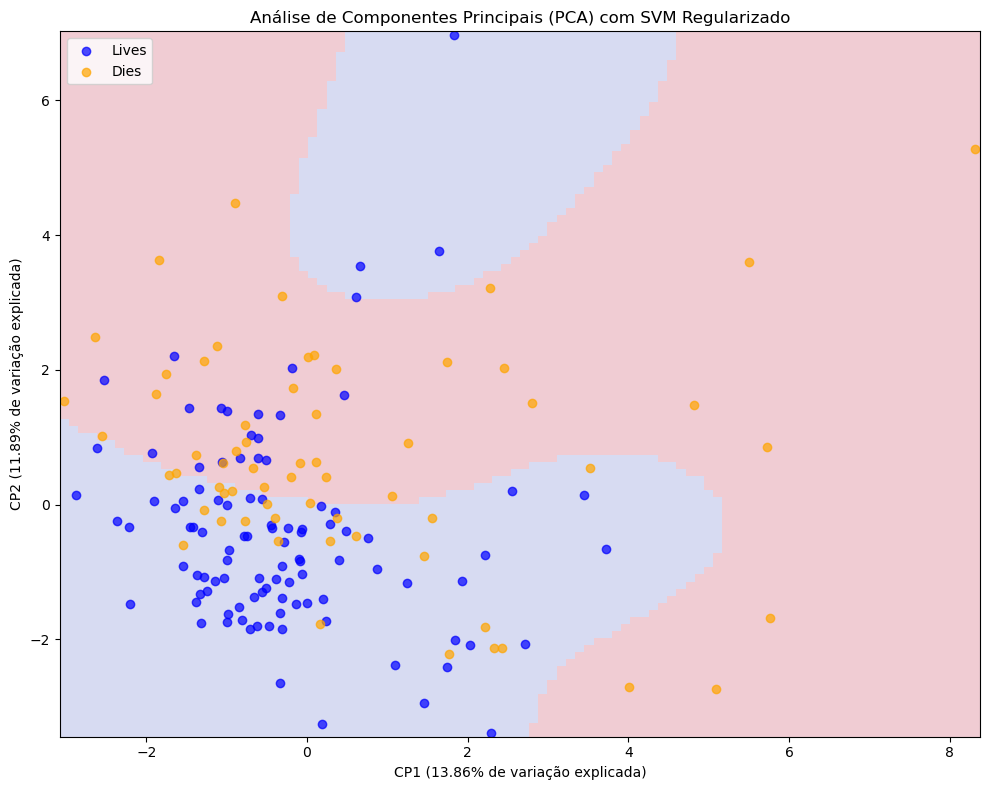

Acurácia do classificador SVM: 0.61


In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Carregar o conjunto de dados
hcc_data = pd.read_csv('hcc_dataset.csv', na_values=['?'])

# Selecionar apenas as variáveis numéricas
numeric_data = hcc_data.select_dtypes(include=[np.number])

# Imputar valores ausentes com a média
imputer = SimpleImputer(strategy='mean')
numeric_data_imputed = imputer.fit_transform(numeric_data)

# Normalizar os dados
scaler = StandardScaler()
scaled_data = scaler.fit_transform(numeric_data_imputed)

# Codificar a variável alvo 'Class'
label_encoder = LabelEncoder()
hcc_data['Class_encoded'] = label_encoder.fit_transform(hcc_data['Class'])

# Aplicação do PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_data)

# Dividir os dados em conjuntos de treinamento e teste usando as componentes principais
X_train, X_test, y_train, y_test = train_test_split(pca_result, hcc_data['Class_encoded'], test_size=0.2, random_state=42)

# Treinando um classificador SVM com regularização ajustada
svm = SVC(kernel='rbf', C=10, gamma=0.1)
svm.fit(X_train, y_train)

# Criando uma grade de pontos para colorir as regiões
xx, yy = np.meshgrid(np.linspace(pca_result[:, 0].min(), pca_result[:, 0].max(), 100),
                     np.linspace(pca_result[:, 1].min(), pca_result[:, 1].max(), 100))
Z = svm.predict(np.c_[xx.ravel(), yy.ravel()])

# Convertendo Z para um array numérico
Z = Z.reshape(xx.shape)

# Plotando os resultados do PCA em 2D com as regiões coloridas
plt.figure(figsize=(10, 8))
plt.pcolormesh(xx, yy, Z, cmap='coolwarm_r', alpha=0.2)  # Usar 'coolwarm_r' para inverter as cores
plt.scatter(pca_result[hcc_data['Class'] == 'Lives', 0], pca_result[hcc_data['Class'] == 'Lives', 1], label='Lives', alpha=0.7, color='blue')
plt.scatter(pca_result[hcc_data['Class'] == 'Dies', 0], pca_result[hcc_data['Class'] == 'Dies', 1], label='Dies', alpha=0.7, color='orange')
plt.title('Análise de Componentes Principais (PCA) com SVM Regularizado')
plt.xlabel(f'CP1 ({pca.explained_variance_ratio_[0]*100:.2f}% de variação explicada)')
plt.ylabel(f'CP2 ({pca.explained_variance_ratio_[1]*100:.2f}% de variação explicada)')
plt.legend(loc='upper left')
plt.tight_layout()
plt.show()

# Avaliar a acurácia do classificador SVM
y_pred = svm.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f'Eficácia do classificador SVM: {accuracy:.2f}')


## Coeficientes dos Componentes Principais

Nesta seção, calculamos e imprimimos os coeficientes dos componentes principais resultantes da Análise de Componentes Principais (PCA). Esses coeficientes, também conhecidos como "loadings", indicam a contribuição de cada variável original para os componentes principais.

### O que são Coeficientes dos Componentes Principais?

Os coeficientes dos componentes principais são os pesos atribuídos a cada variável original na formação dos componentes principais. Eles representam a importância de cada variável na nova base de componentes principais.

### Interpretação dos Coeficientes

- **Valores Positivos e Negativos**: Um coeficiente positivo indica que a variável original contribui positivamente para o componente principal, enquanto um coeficiente negativo indica uma contribuição negativa.
- **Magnitude dos Coeficientes**: A magnitude do coeficiente indica a força da contribuição da variável original para o componente principal. Coeficientes com maior magnitude (positiva ou negativa) têm uma influência maior no componente principal.

### Por que Analisar os Coeficientes?

Analisar os coeficientes dos componentes principais é importante, já que:

1. **Compreensão da Estrutura dos Dados**: Ajuda a entender como as variáveis originais contribuem para os componentes principais.
2. **Interpretação dos Componentes**: Facilita a interpretação dos componentes principais em termos das variáveis originais.
3. **Seleção de Variáveis**: Pode orientar a seleção de variáveis mais importantes para análises subsequentes.

Vamos calcular e imprimir os coeficientes dos componentes principais.

In [36]:
# Coeficientes dos componentes principais
loadings = pd.DataFrame(pca.components_.T, columns=['Componente Principal 1', 'Componente Principal 2'], index=numeric_data.columns)
print(loadings)

            Componente Principal 1  Componente Principal 2
Age                      -0.146452                0.040229
Grams_day                 0.059537               -0.051097
Packs_year               -0.053973                0.028900
INR                       0.179330               -0.051085
AFP                       0.038993                0.223473
Hemoglobin                0.000981               -0.232609
MCV                       0.249179               -0.276334
Leucocytes                0.025256                0.231759
Platelets                 0.033084                0.327591
 Albumin                 -0.188126               -0.090142
Total_Bil                 0.405586                0.091349
ALT                       0.327961                0.013550
AST                       0.350893                0.032595
GGT                       0.140819                0.353582
ALP                       0.167484                0.391951
TP                       -0.025443                0.0379

## Diferença entre SVM Regularizado e SVM Otimizado

Nesta seção, discutimos a diferença entre um classificador SVM regularizado e um classificador SVM otimizado, além de explicar o processo de busca em grade (Grid Search) para otimização de hiperparâmetros.

### SVM Regularizado

Um classificador SVM (Máquina de Vetores de Suporte) regularizado é um modelo que utiliza parâmetros de regularização padrão para controlar a complexidade do modelo e evitar overfitting. A regularização é uma técnica que adiciona uma penalidade à função de custo do modelo para reduzir a complexidade e melhorar a generalização.

No exemplo anterior, utilizamos um SVM com os seguintes parâmetros de regularização:
- **C**: 10 (parâmetro de regularização)
- **gamma**: 0.1 (parâmetro do kernel RBF)

### SVM Otimizado

Um classificador SVM otimizado é um modelo que passou por um processo de otimização de hiperparâmetros para encontrar os melhores valores para os parâmetros de regularização. A otimização de hiperparâmetros é realizada utilizando uma técnica chamada busca em grade (Grid Search), que testa várias combinações de parâmetros e seleciona a combinação que resulta no melhor desempenho do modelo.

### Busca em Grade (Grid Search)

A busca em grade é uma técnica de otimização de hiperparâmetros que envolve a definição de uma grade de valores possíveis para cada hiperparâmetro e a avaliação do desempenho do modelo para cada combinação de valores. O processo inclui:

1. **Definição da Grade de Parâmetros**: Especificamos uma grade de valores possíveis para os hiperparâmetros `C` e `gamma`.
2. **Inicialização do Modelo SVM**: Criamos uma instância do modelo SVM.
3. **Execução da Busca em Grade**: Utilizamos a classe `GridSearchCV` do `sklearn.model_selection` para realizar a busca em grade com validação cruzada (cross-validation).
4. **Seleção dos Melhores Parâmetros**: A busca em grade retorna a combinação de hiperparâmetros que resulta no melhor desempenho do modelo.

### Implementação

Abaixo está o código para realizar a busca em grade e visualizar os resultados do SVM otimizado:


Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01

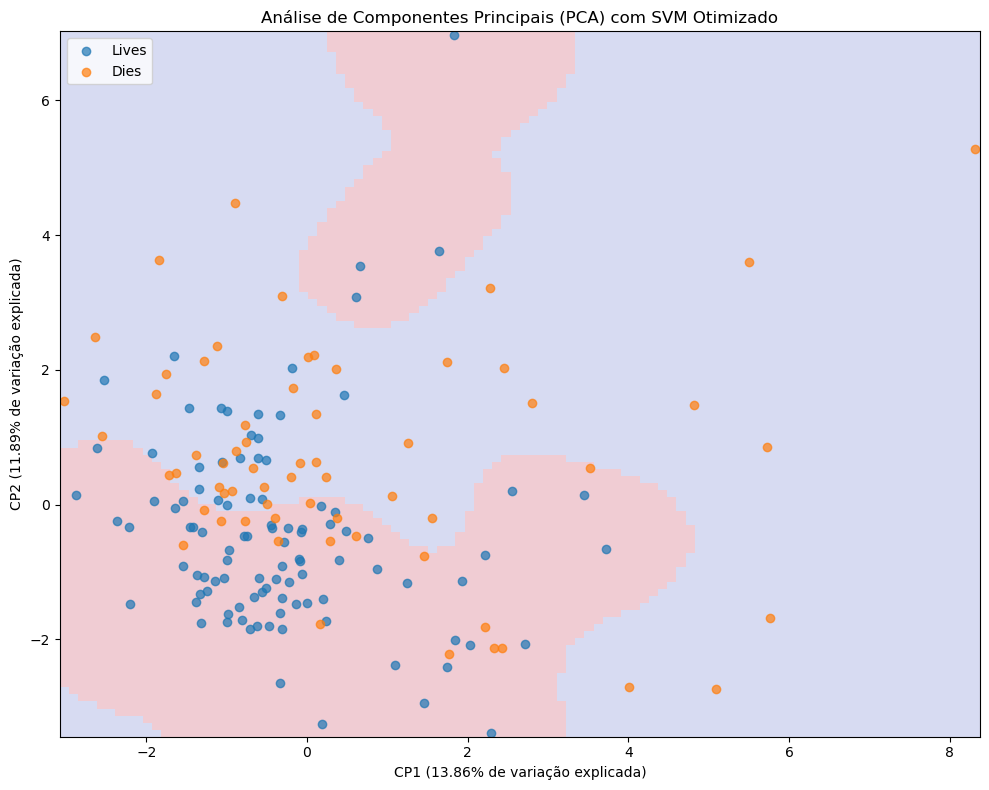

Acurácia do classificador SVM otimizado: 0.58


In [17]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score

# Definindo os parâmetros para a busca em grade
param_grid = {
    'C': [0.1, 1, 10, 100],
    'gamma': [1, 0.1, 0.01, 0.001],
    'kernel': ['rbf']
}

# Inicializando o modelo SVM
svm = SVC()

# Inicializando a busca em grade
grid = GridSearchCV(svm, param_grid, refit=True, verbose=2, cv=5)
grid.fit(X_train, y_train)

# Imprimindo os melhores parâmetros
print(f"Melhores parâmetros: {grid.best_params_}")

# Usando os melhores parâmetros para prever
best_svm = grid.best_estimator_

# Criando uma grade de pontos para colorir as regiões
xx, yy = np.meshgrid(np.linspace(pca_result[:, 0].min(), pca_result[:, 0].max(), 100),
                     np.linspace(pca_result[:, 1].min(), pca_result[:, 1].max(), 100))
Z = best_svm.predict(np.c_[xx.ravel(), yy.ravel()])

# Convertendo Z para um array numérico
Z = Z.reshape(xx.shape)

# Plotando os resultados do PCA em 2D com as regiões coloridas
plt.figure(figsize=(10, 8))
plt.pcolormesh(xx, yy, Z, cmap='coolwarm', alpha=0.2)
plt.scatter(pca_result[hcc_data['Class'] == 'Lives', 0], pca_result[hcc_data['Class'] == 'Lives', 1], label='Lives', alpha=0.7)
plt.scatter(pca_result[hcc_data['Class'] == 'Dies', 0], pca_result[hcc_data['Class'] == 'Dies', 1], label='Dies', alpha=0.7)
plt.title('Análise de Componentes Principais (PCA) com SVM Otimizado')
plt.xlabel(f'CP1 ({pca.explained_variance_ratio_[0]*100:.2f}% de variação explicada)')
plt.ylabel(f'CP2 ({pca.explained_variance_ratio_[1]*100:.2f}% de variação explicada)')
plt.legend(loc='upper left')
plt.tight_layout()
plt.show()

# Avaliar a acurácia do classificador SVM otimizado
y_pred = best_svm.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f'Eficácia do classificador SVM otimizado: {accuracy:.2f}')

## Pré-processamento e Seleção de Características com Classificação KNN

Nesta secção, carregamos e pré-processamos o conjunto de dados, aplicamos técnicas de seleção de características e treinamos um classificador KNN (K-Nearest Neighbors) para avaliar a precisão do modelo. As técnicas de seleção de características utilizadas são Feature Agglomeration e Univariate Selection.

### Passos do Código

1. **Seleção e Imputação de Variáveis Numéricas**:
   - Selecionamos apenas as variáveis numéricas do conjunto de dados.
   - Imputamos valores ausentes com a média utilizando `SimpleImputer`.

2. **Normalização dos Dados**:
   - Normalizamos os dados utilizando `StandardScaler` para garantir que todas as variáveis tenham a mesma escala.

3. **Codificação da Variável Alvo**:
   - Codificamos a variável alvo 'Class' em valores numéricos utilizando `LabelEncoder`.

4. **Divisão dos Dados**:
   - Dividimos os dados em conjuntos de treinamento e teste utilizando `train_test_split`.

### Feature Agglomeration

Feature Agglomeration é uma técnica de redução de dimensionalidade que agrupa características semelhantes em clusters. Neste exemplo, reduzimos as características para 2 clusters.

#### Passos:

1. **Aplicação do Feature Agglomeration**:
   - Aplicamos `FeatureAgglomeration` para reduzir a dimensionalidade dos dados de treinamento e teste.
   - Imprimimos a dimensionalidade original e a reduzida.

2. **Treinamento e Avaliação do Classificador KNN**:
   - Treinamos um classificador KNN com os dados reduzidos pelo Feature Agglomeration.
   - Avaliamos a precisão do modelo no conjunto de teste.

### Univariate Selection

Univariate Selection é uma técnica de seleção de características que seleciona as melhores características com base em testes estatísticos univariados. Neste exemplo, utilizamos `SelectKBest` com a função `f_classif` para selecionar as 2 melhores características.

#### Passos:

1. **Aplicação do Univariate Selection**:
   - Aplicamos `SelectKBest` para selecionar as 2 melhores características dos dados de treinamento e teste.
   - Imprimimos a dimensionalidade original e a reduzida.

2. **Treinamento e Avaliação do Classificador KNN**:
   - Treinamos um classificador KNN com os dados reduzidos pelo Univariate Selection.
   - Avaliamos a precisão do modelo no conjunto de teste.

### Implementação

Abaixo está o código para realizar o pré-processamento, a seleção de características e a avaliação do classificador KNN:


In [18]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.cluster import FeatureAgglomeration
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

# Carregar o conjunto de dados
hcc_data = pd.read_csv('hcc_dataset.csv', na_values=['?'])

# Verificar se o DataFrame foi carregado corretamente
print(hcc_data.head())

# Selecionar apenas as variáveis numéricas
numeric_data = hcc_data.select_dtypes(include=[np.number])

# Imputar valores ausentes com a média
imputer = SimpleImputer(strategy='mean')
numeric_data_imputed = imputer.fit_transform(numeric_data)

# Normalizando os dados
scaler = StandardScaler()
scaled_data = scaler.fit_transform(numeric_data_imputed)

# Codificar a variável alvo 'Class'
label_encoder = LabelEncoder()
hcc_data['Class_encoded'] = label_encoder.fit_transform(hcc_data['Class'])

# Dividindo os dados em conjuntos de treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(scaled_data, hcc_data['Class_encoded'], test_size=0.2, random_state=42)

# Aplicar Feature Agglomeration
agglo = FeatureAgglomeration(n_clusters=2)
X_train_agglo = agglo.fit_transform(X_train)
X_test_agglo = agglo.transform(X_test)

print("Dimensionalidade original:", X_train.shape)
print("Dimensionalidade reduzida com Feature Agglomeration:", X_train_agglo.shape)

# Aplicar Univariate Selection com f_classif
selector = SelectKBest(score_func=f_classif, k=2)
X_train_uni = selector.fit_transform(X_train, y_train)
X_test_uni = selector.transform(X_test)

print("Dimensionalidade original:", X_train.shape)
print("Dimensionalidade reduzida com Univariate Selection:", X_train_uni.shape)

# Treinando um classificador KNN com Feature Agglomeration
knn_agglo = KNeighborsClassifier(n_neighbors=15)
knn_agglo.fit(X_train_agglo, y_train)

# Prevendo e avaliando
y_pred_agglo = knn_agglo.predict(X_test_agglo)
accuracy_agglo = accuracy_score(y_test, y_pred_agglo)
print(f"Precisão com Feature Agglomeration: {accuracy_agglo:.2f}")

# Treinando um classificador KNN com Univariate Selection
knn_uni = KNeighborsClassifier(n_neighbors=15)
knn_uni.fit(X_train_uni, y_train)

# Prevendo e avaliando
y_pred_uni = knn_uni.predict(X_test_uni)
accuracy_uni = accuracy_score(y_test, y_pred_uni)
print(f"Precisão com Univariate Selection: {accuracy_uni:.2f}")

   Gender Symptoms Alcohol HBsAg HBeAg HBcAb HCVAb Cirrhosis Endemic Smoking  \
0    Male       No     Yes    No    No    No    No       Yes      No     Yes   
1  Female      NaN      No    No    No    No   Yes       Yes     NaN     NaN   
2    Male       No     Yes   Yes    No   Yes    No       Yes      No     Yes   
3    Male      Yes     Yes    No    No    No    No       Yes      No     Yes   
4    Male      Yes     Yes   Yes    No   Yes    No       Yes      No     Yes   

   ...    ALP   TP Creatinine Nodules Major_Dim Dir_Bil  Iron   Sat Ferritin  \
0  ...  150.0  7.1       0.70     1.0       3.5     0.5   NaN   NaN      NaN   
1  ...    NaN  NaN        NaN     1.0       1.8     NaN   NaN   NaN      NaN   
2  ...  109.0  7.0       2.10     5.0      13.0     0.1  28.0   6.0     16.0   
3  ...  174.0  8.1       1.11     2.0      15.7     0.2   NaN   NaN      NaN   
4  ...  109.0  6.9       1.80     1.0       9.0     NaN  59.0  15.0     22.0   

   Class  
0  Lives  
1  Lives  
2  Li

## Otimização de Hiperparâmetros do SVM com Busca em Grade

Nesta seção, utilizamos a técnica de busca em grade (Grid Search) para otimizar os hiperparâmetros de um classificador SVM (Máquina de Vetores de Suporte). A busca em grade nos permite testar várias combinações de hiperparâmetros e selecionar a combinação que resulta no melhor desempenho do modelo.

### Passos do Código

1. **Definição da Grade de Parâmetros**:
   - Definimos uma grade de valores possíveis para os hiperparâmetros `C`, `gamma` e `kernel` do SVM. A grade inclui os seguintes valores:
     - `C`: [0.1, 1, 10, 100]
     - `gamma`: [1, 0.1, 0.01, 0.001]
     - `kernel`: ['rbf']

2. **Inicialização do Modelo SVM**:
   - Criamos uma instância do modelo SVM utilizando a classe `SVC` do `sklearn.svm`.

3. **Execução da Busca em Grade**:
   - Utilizamos a classe `GridSearchCV` do `sklearn.model_selection` para realizar a busca em grade com validação cruzada (cross-validation). A busca em grade testa todas as combinações de hiperparâmetros especificadas na grade e seleciona a combinação que resulta no melhor desempenho do modelo.
   - A busca em grade é inicializada com os seguintes parâmetros:
     - `svm`: O modelo SVM a ser otimizado.
     - `param_grid`: A grade de hiperparâmetros a ser testada.
     - `refit=True`: Reajusta o modelo com os melhores hiperparâmetros encontrados.
     - `verbose=2`: Exibe mensagens detalhadas durante a execução.
     - `cv=5`: Utiliza validação cruzada com 5 folds.

4. **Treinamento do Modelo Otimizado**:
   - Ajustamos o modelo SVM utilizando os dados de treinamento (`X_train` e `y_train`).

5. **Impressão dos Melhores Parâmetros**:
   - Imprimimos os melhores hiperparâmetros encontrados pela busca em grade.

6. **Previsão e Avaliação**:
   - Utilizamos o modelo otimizado para prever as classes no conjunto de teste (`X_test`).
   - Calculamos a acurácia do modelo utilizando a função `accuracy_score` do `sklearn.metrics`.
   - Imprimimos a acurácia do modelo otimizado.

### Implementação

Abaixo está o código para realizar a busca em grade e avaliar o modelo SVM otimizado:


In [8]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

# Definindo os parâmetros para a busca em grade
param_grid = {
    'C': [0.1, 1, 10, 100],
    'gamma': [1, 0.1, 0.01, 0.001],
    'kernel': ['rbf']
}

# Inicializando o modelo SVM
svm = SVC()

# Inicializando a busca em grade
grid = GridSearchCV(svm, param_grid, refit=True, verbose=2, cv=5)
grid.fit(X_train, y_train)

# Imprimindo os melhores parâmetros
print(f"Melhores parâmetros: {grid.best_params_}")

# Usando os melhores parâmetros para prever
best_svm = grid.best_estimator_

# Prevendo e avaliando
y_pred_svm = best_svm.predict(X_test)
accuracy_svm = accuracy_score(y_test, y_pred_svm)
print(f"Precisão com SVM Otimizado: {accuracy_svm:.2f}")

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01

## Classificação com Random Forest

Nesta seção, utilizamos um classificador Random Forest para treinar e avaliar o modelo. Random Forest é um algoritmo de aprendizagem computacional baseado em árvores de decisão que utiliza um conjunto de árvores de decisão para melhorar a precisão e controlar o overfitting.

### Passos do Código

1. **Inicialização do Modelo Random Forest**:
   - Criamos uma instância do modelo Random Forest utilizando a classe `RandomForestClassifier` do `sklearn.ensemble`.
   - Especificamos o número de árvores na floresta (`n_estimators=100`) e uma semente aleatória (`random_state=42`) para garantir a reprodutibilidade dos resultados.

2. **Treinamento do Modelo**:
   - Ajustamos o modelo Random Forest utilizando os dados de treinamento (`X_train` e `y_train`).

3. **Previsão e Avaliação**:
   - Utilizamos o modelo treinado para prever as classes no conjunto de teste (`X_test`).
   - Calculamos a acurácia do modelo utilizando a função `accuracy_score` do `sklearn.metrics`.
   - Imprimimos a acurácia do modelo.

### Implementação

Abaixo está o código para inicializar, treinar e avaliar o modelo Random Forest:


In [9]:
from sklearn.ensemble import RandomForestClassifier

# Inicializando o modelo Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)

# Treinando o modelo
rf.fit(X_train, y_train)

# Prevendo e avaliando
y_pred_rf = rf.predict(X_test)
accuracy_rf = accuracy_score(y_test, y_pred_rf)
print(f"Precisão com Random Forest: {accuracy_rf:.2f}")

Precisão com Random Forest: 0.70


## Explicação dos Modelos: Random Forest e Gradient Boosting

Nesta seção, discutimos dois poderosos algoritmos de aprendizagem máquina baseados em árvores de decisão: Random Forest e Gradient Boosting. Ambos os modelos são amplamente utilizados para tarefas de classificação e regressão devido à sua capacidade de lidar com dados complexos e fornecer previsões precisas.

### Random Forest

**Random Forest** é um algoritmo de aprendizagem computacional que consiste em um conjunto de árvores de decisão. Ele utiliza o conceito de "bagging" (bootstrap aggregating) para melhorar a precisão e controlar o overfitting. Aqui estão algumas características e vantagens do Random Forest:

- **Ensemble de Árvores de Decisão**: Random Forest constrói múltiplas árvores de decisão durante o treinamento e combina suas previsões para obter uma previsão final mais robusta.
- **Redução de Overfitting**: Ao treinar várias árvores em diferentes subconjuntos dos dados, o Random Forest reduz o risco de overfitting, que é comum em árvores de decisão individuais.
- **Importância das Características**: Random Forest fornece uma medida da importância das características, o que pode ser útil para entender quais variáveis são mais influentes na previsão.
- **Robustez a Outliers e Ruído**: Devido à sua natureza de ensemble, o Random Forest é menos sensível a outliers e ruído nos dados.

### Gradient Boosting

**Gradient Boosting** é um algoritmo de aprendizagem computacional que também utiliza um conjunto de árvores de decisão, mas com uma abordagem diferente chamada "boosting". Aqui estão algumas características e vantagens do Gradient Boosting:

- **Boosting**: Ao contrário do bagging, o boosting constrói árvores de decisão sequencialmente, onde cada árvore tenta corrigir os erros das árvores anteriores. Isso costuma resultar num modelo mais forte e preciso.
- **Redução de Erros**: Cada árvore adicional no Gradient Boosting é treinada para reduzir os erros residuais das árvores anteriores, melhorando continuamente a precisão do modelo.
- **Flexibilidade**: Gradient Boosting pode ser ajustado com vários hiperparâmetros, como a taxa de aprendizado (`learning_rate`), o número de árvores (`n_estimators`) e a profundidade máxima das árvores (`max_depth`), permitindo um controle fino sobre o desempenho do modelo.
- **Desempenho em Dados Complexos**: Gradient Boosting é particularmente eficaz em dados complexos e de alta dimensionalidade, onde outros modelos podem falhar.

### Implementação

Abaixo está o código para inicializar, treinar e avaliar os modelos Random Forest e Gradient Boosting:


In [10]:
from sklearn.ensemble import GradientBoostingClassifier

# Inicializando o modelo Gradient Boosting
gb = GradientBoostingClassifier(n_estimators=100, random_state=42)

# Treinando o modelo
gb.fit(X_train, y_train)

# Prevendo e avaliando
y_pred_gb = gb.predict(X_test)
accuracy_gb = accuracy_score(y_test, y_pred_gb)
print(f"Precisão com Gradient Boosting: {accuracy_gb:.2f}")

Precisão com Gradient Boosting: 0.70


## Classificação com Voting Classifier

Nesta seção, utilizamos um Voting Classifier para combinar as previsões de múltiplos modelos de aprendizado de máquina. O Voting Classifier é uma técnica de ensemble que agrega as previsões de vários modelos baseados em diferentes algoritmos para melhorar a robustez e a precisão das previsões.

### O que é um Voting Classifier?

O Voting Classifier combina as previsões de vários modelos de aprendizado de máquina e toma uma decisão final com base na votação das previsões individuais. Existem dois tipos principais de votação:

- **Votação Dura (Hard Voting)**: Cada modelo faz uma previsão e a classe com mais votos é escolhida como a previsão final.
- **Votação Suave (Soft Voting)**: Cada modelo fornece uma probabilidade para cada classe, e a classe com a maior soma de probabilidades ponderadas é escolhida como a previsão final.

### Modelos Utilizados

Nesta implementação, combinamos três modelos diferentes:
- **Random Forest**: Um ensemble de árvores de decisão que utiliza o método de bagging.
- **Gradient Boosting**: Um ensemble de árvores de decisão que utiliza o método de boosting.
- **SVM (Support Vector Machine)**: Um classificador que encontra o hiperplano que melhor separa as classes.

### Implementação

Abaixo está o código para inicializar, treinar e avaliar o Voting Classifier:


In [22]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier

# Inicializando os modelos
rf = RandomForestClassifier(n_estimators=100, random_state=42)
gb = GradientBoostingClassifier(n_estimators=100, random_state=42)
svm = SVC(probability=True, C=grid.best_params_['C'], gamma=grid.best_params_['gamma'], kernel='rbf')

# Combinando os modelos com Voting Classifier
voting_clf = VotingClassifier(estimators=[
    ('rf', rf), 
    ('gb', gb), 
    ('svm', svm)
], voting='soft')

# Treinando o modelo combinado
voting_clf.fit(X_train, y_train)

# Prevendo e avaliando
y_pred_voting = voting_clf.predict(X_test)
accuracy_voting = accuracy_score(y_test, y_pred_voting)
print(f"Precisão com Voting Classifier: {accuracy_voting:.2f}")

Precisão com Voting Classifier: 0.70


## Otimização de Hiperparâmetros do Random Forest com Busca em Grade

Vamos utilizar a técnica de busca em grade (Grid Search) para otimizar os hiperparâmetros de um classificador Random Forest. A busca em grade deixa-nos testar várias combinações de hiperparâmetros e selecionar a combinação que resulta no melhor desempenho do modelo.

### Passos do Código

1. **Definição da Grade de Parâmetros**:
   - Definimos uma grade de valores possíveis para os hiperparâmetros do Random Forest. A grade inclui os seguintes valores:
     - `n_estimators`: [100, 200, 300] (número de árvores na floresta)
     - `max_features`: ['auto', 'sqrt', 'log2'] (número de características a serem consideradas para encontrar a melhor divisão)
     - `max_depth`: [4, 6, 8, 10] (profundidade máxima das árvores)
     - `criterion`: ['gini', 'entropy'] (função para medir a qualidade da divisão)

2. **Inicialização do Modelo Random Forest**:
   - Criamos uma instância do modelo Random Forest utilizando a classe `RandomForestClassifier` do `sklearn.ensemble`.

3. **Execução da Busca em Grade**:
   - Utilizamos a classe `GridSearchCV` do `sklearn.model_selection` para realizar a busca em grade com validação cruzada (cross-validation). A busca em grade testa todas as combinações de hiperparâmetros especificadas na grade e seleciona a combinação que resulta no melhor desempenho do modelo.
   - A busca em grade é inicializada com os seguintes parâmetros:
     - `estimator`: O modelo Random Forest a ser otimizado.
     - `param_grid`: A grade de hiperparâmetros a ser testada.
     - `refit=True`: Reajusta o modelo com os melhores hiperparâmetros encontrados.
     - `verbose=2`: Exibe mensagens detalhadas durante a execução.
     - `cv=5`: Utiliza validação cruzada com 5 folds.

4. **Treinamento do Modelo Otimizado**:
   - Ajustamos o modelo Random Forest utilizando os dados de treinamento (`X_train` e `y_train`).

5. **Impressão dos Melhores Parâmetros**:
   - Imprimimos os melhores hiperparâmetros encontrados pela busca em grade.

6. **Previsão e Avaliação**:
   - Utilizamos o modelo otimizado para prever as classes no conjunto de teste (`X_test`).
   - Calculamos a acurácia do modelo utilizando a função `accuracy_score` do `sklearn.metrics`.
   - Imprimimos a acurácia do modelo otimizado.

### Implementação

Abaixo está o código para realizar a busca em grade e avaliar o modelo Random Forest otimizado:


In [12]:
param_grid_rf = {
    'n_estimators': [100, 200, 300],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth': [4, 6, 8, 10],
    'criterion': ['gini', 'entropy']
}

grid_rf = GridSearchCV(RandomForestClassifier(random_state=42), param_grid_rf, refit=True, verbose=2, cv=5)
grid_rf.fit(X_train, y_train)

print(f"Melhores parâmetros para Random Forest: {grid_rf.best_params_}")

best_rf = grid_rf.best_estimator_
y_pred_best_rf = best_rf.predict(X_test)
accuracy_best_rf = accuracy_score(y_test, y_pred_best_rf)
print(f"Acurácia com Random Forest Otimizado: {accuracy_best_rf:.2f}")

Fitting 5 folds for each of 72 candidates, totalling 360 fits
[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=100; total time=   0.0s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=100; total time=   0.0s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=300; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=300; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=300; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=300; total time=   0.4s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=200; total time=   0.1s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=200; total time=   0.1s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_e

c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=100; total time=   0.0s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=100; total time=   0.0s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=300; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=300; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=300; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=300; total time=   0.3s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200; total time=   0.1s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, n_e

c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=100; total time=   0.0s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=300; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=300; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=300; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=300; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=300; total time=   0.3s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200; total time=   0.1s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, n_e

c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=100; total time=   0.0s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=100; total time=   0.0s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=300; total time=   0.5s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=300; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=300; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=300; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=300; total time=   0.3s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=10, max_feature

c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=100; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=100; total time=   0.0s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=100; total time=   0.0s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=300; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=300; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=300; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=300; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=300; total time=   0.3s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=200; total time=   0.1s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, ma

c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=200; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=200; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=300; total time=   0.4s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, ma

c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=100; total time=   0.0s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=300; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=300; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=300; total time=   0.4s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, ma

c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=100; total time=   0.0s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=300; total time=   0.5s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=300; total time=   0.4s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, n_estimators=200; total time=   0.3s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=e

c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


## Otimização de Hiperparâmetros do Gradient Boosting com Busca em Grade

Nesta seção, utilizamos a técnica de busca em grade (Grid Search) para otimizar os hiperparâmetros de um classificador Gradient Boosting. O mesmo que fizemos antes, mas agora com outro modelo. Os passos são quase os mesmos que da última vez.

### Implementação

Veja aqui o código em ação:


In [13]:
param_grid_gb = {
    'n_estimators': [100, 200],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 4, 5, 6]
}

grid_gb = GridSearchCV(GradientBoostingClassifier(random_state=42), param_grid_gb, refit=True, verbose=2, cv=5)
grid_gb.fit(X_train, y_train)

print(f"Melhores parâmetros para Gradient Boosting: {grid_gb.best_params_}")

best_gb = grid_gb.best_estimator_
y_pred_best_gb = best_gb.predict(X_test)
accuracy_best_gb = accuracy_score(y_test, y_pred_best_gb)
print(f"Acurácia com Gradient Boosting Otimizado: {accuracy_best_gb:.2f}")

Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.0s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.2s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=4, n_estimators=100; total time=   0.1s
[CV] END ..learning_rate=0.01, max_depth=4, n_e

## Importância das Características

Nesta etapa do projeto, utilizamos o modelo Random Forest otimizado para avaliar a importância das características (features) presentes no conjunto de dados de Carcinoma Hepatocelular (HCC).

A importância das características é uma medida que indica o quanto cada variável contribui para a capacidade preditiva do modelo. Ela é calculada com base na diminuição média da impureza (por exemplo, o índice Gini) em todas as árvores de decisão do Random Forest.

O gráfico de barras apresentado mostra a importância relativa de cada característica, ordenada da mais importante para a menos importante. Podemos observar que algumas variáveis se destacam como as mais relevantes para o modelo, enquanto outras têm uma contribuição menor.

Essa análise nos permite identificar quais variáveis têm maior impacto na predição da sobrevivência dos pacientes com HCC. Algumas observações interessantes:

- A variável "AFP" (Alpha-Fetoprotein) aparece como a mais importante, indicando que os níveis dessa proteína têm um papel significativo na previsão da sobrevivência.
- Outras variáveis clínicas, como "ALP" (Alkaline Phosphatase), "Iron" (Ferro) e "AST" (Aspartate Aminotransferase), também se mostram relevantes para o modelo.
- Variáveis demográficas, como "Age" (Idade) e "Gender" (Género), têm uma importância relativamente menor em comparação com as variáveis clínicas.

Essa informação é valiosa para entender quais variáveis têm maior influência na previsão da sobrevivência dos pacientes com HCC. Ela pode orientar a seleção de características para modelos futuros, focando nas variáveis mais importantes e potencialmente reduzindo a dimensionalidade do conjunto de dados.

Além disso, a importância das características pode fornecer insights clínicos sobre quais fatores estão mais associados ao prognóstico dos pacientes, auxiliando na tomada de decisões médicas e no desenvolvimento de estratégias de tratamento.

É importante ressaltar que a importância das características pode variar dependendo do modelo utilizado e do conjunto de dados específico. Portanto, esta análise será feita em conjunto com outras técnicas de avaliação e validação do modelo.

c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


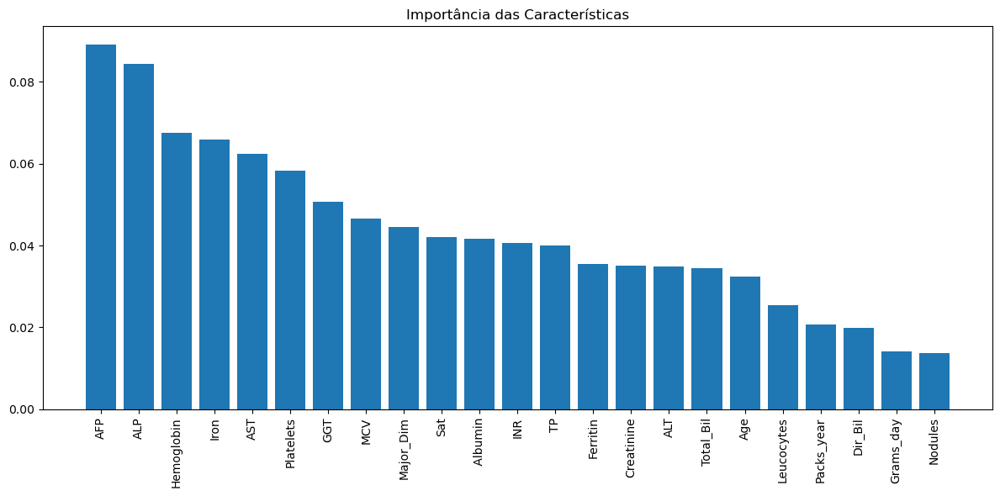

In [14]:
import matplotlib.pyplot as plt

# Treinando o modelo Random Forest otimizado
best_rf.fit(X_train, y_train)

# Obtendo a importância das características
importances = best_rf.feature_importances_
indices = np.argsort(importances)[::-1]

# Plotando a importância das características
plt.figure(figsize=(12, 6))
plt.title("Importância das Características")
plt.bar(range(X_train.shape[1]), importances[indices], align="center")
plt.xticks(range(X_train.shape[1]), [numeric_data.columns[i] for i in indices], rotation=90)
plt.tight_layout()
plt.show()

## Pré-processamento e Engenharia de Características

Nesta seção, carregamos e pré-processamos o conjunto de dados, selecionamos as características mais importantes e criamos interações entre elas para melhorar o desempenho do modelo.

### Passos do Código

1. **Carregamento dos Dados**:
   - Carregamos o conjunto de dados `hcc_dataset.csv` e tratamos valores ausentes representados por `?`.

2. **Seleção de Variáveis Numéricas**:
   - Selecionamos apenas as variáveis numéricas do conjunto de dados.

3. **Imputação de Valores Ausentes**:
   - Utilizamos `SimpleImputer` para substituir valores ausentes pela média das colunas.

4. **Normalização dos Dados**:
   - Normalizamos os dados utilizando `StandardScaler` para garantir que todas as variáveis tenham a mesma escala.

5. **Codificação da Variável Alvo**:
   - Codificamos a variável alvo 'Class' em valores numéricos utilizando `LabelEncoder`.

6. **Seleção das Características Mais Importantes**:
   - Selecionamos as 5 características mais importantes com base na importância calculada anteriormente (`indices`).

7. **Imputação de Valores Ausentes nas Características Importantes**:
   - Imputamos valores ausentes nas características importantes utilizando `SimpleImputer`.

8. **Criação de Interações entre Características**:
   - Utilizamos `PolynomialFeatures` para criar interações de segundo grau entre as características importantes, sem incluir termos de bias.

9. **Normalização das Novas Características**:
   - Normalizamos as novas características geradas pelas interações.

10. **Divisão dos Dados em Conjuntos de Treinamento e Teste**:
    - Dividimos os dados em conjuntos de treinamento e teste utilizando `train_test_split`, com 20% dos dados para teste.

### Implementação

Abaixo está o código para realizar o pré-processamento e a engenharia de características:


In [24]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import PolynomialFeatures, StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

# Carregar o conjunto de dados
hcc_data = pd.read_csv('hcc_dataset.csv', na_values=['?'])

# Selecionar apenas as variáveis numéricas
numeric_data = hcc_data.select_dtypes(include=[np.number])

# Imputar valores ausentes com a média
imputer = SimpleImputer(strategy='mean')
numeric_data_imputed = imputer.fit_transform(numeric_data)

# Normalizar os dados
scaler = StandardScaler()
scaled_data = scaler.fit_transform(numeric_data_imputed)

# Codificar a variável alvo 'Class'
label_encoder = LabelEncoder()
hcc_data['Class_encoded'] = label_encoder.fit_transform(hcc_data['Class'])

# Treinar um modelo Random Forest para calcular a importância das características
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(scaled_data, hcc_data['Class_encoded'])

# Obter a importância das características
importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]

# Selecionar as características mais importantes
important_features = [numeric_data.columns[i] for i in indices[:5]]
X_important = hcc_data[important_features]

# Imputar valores ausentes nas características importantes
X_important_imputed = imputer.fit_transform(X_important)

# Criar interações entre as características
poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
X_poly = poly.fit_transform(X_important_imputed)

# Normalizar as novas características
X_poly_scaled = scaler.fit_transform(X_poly)

# Dividir os dados em conjuntos de treinamento e teste
X_train_poly, X_test_poly, y_train, y_test = train_test_split(X_poly_scaled, hcc_data['Class_encoded'], test_size=0.2, random_state=42)

## Avaliação do Modelo com Validação Cruzada

Utilizamos a busca em grade para otimizar os hiperparâmetros do Random Forest e avaliamos o modelo com validação cruzada para obter uma estimativa robusta da performance.

### Implementação


In [28]:
from sklearn.model_selection import cross_val_score

# Avaliar o modelo Random Forest otimizado com validação cruzada
scores = cross_val_score(best_rf, X_train_poly, y_train, cv=5)
print(f"Exatidão média com validação cruzada: {scores.mean():.2f} ± {scores.std():.2f}")

c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default valu

Exatidão média com validação cruzada: 0.71 ± 0.06


In [26]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import PolynomialFeatures, StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Carregar o conjunto de dados
hcc_data = pd.read_csv('hcc_dataset.csv', na_values=['?'])

# Selecionar apenas as variáveis numéricas
numeric_data = hcc_data.select_dtypes(include=[np.number])

# Imputar valores ausentes com a média
imputer = SimpleImputer(strategy='mean')
numeric_data_imputed = imputer.fit_transform(numeric_data)

# Normalizar os dados
scaler = StandardScaler()
scaled_data = scaler.fit_transform(numeric_data_imputed)

# Codificar a variável alvo 'Class'
label_encoder = LabelEncoder()
hcc_data['Class_encoded'] = label_encoder.fit_transform(hcc_data['Class'])

# Treinar um modelo Random Forest para calcular a importância das características
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(scaled_data, hcc_data['Class_encoded'])

# Obter a importância das características
importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]

# Selecionar as características mais importantes
important_features = [numeric_data.columns[i] for i in indices[:5]]
X_important = hcc_data[important_features]

# Imputar valores ausentes nas características importantes
X_important_imputed = imputer.fit_transform(X_important)

# Criar interações entre as características
poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
X_poly = poly.fit_transform(X_important_imputed)

# Normalizar as novas características
X_poly_scaled = scaler.fit_transform(X_poly)

# Dividir os dados em conjuntos de treinamento e teste
X_train_poly, X_test_poly, y_train, y_test = train_test_split(X_poly_scaled, hcc_data['Class_encoded'], test_size=0.2, random_state=42)

# Definindo os parâmetros para a busca em grade
param_grid_rf = {
    'n_estimators': [100, 200, 300],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth': [4, 6, 8, 10],
    'criterion': ['gini', 'entropy']
}

# Inicializando a busca em grade
grid_rf = GridSearchCV(RandomForestClassifier(random_state=42), param_grid_rf, refit=True, verbose=2, cv=5)
grid_rf.fit(X_train_poly, y_train)

# Imprimindo os melhores parâmetros
print(f"Melhores parâmetros para Random Forest: {grid_rf.best_params_}")

# Usando os melhores parâmetros para prever
best_rf = grid_rf.best_estimator_

# Avaliar o modelo Random Forest otimizado com validação cruzada
scores = cross_val_score(best_rf, X_train_poly, y_train, cv=5)
print(f"Exatidão média com validação cruzada: {scores.mean():.2f} ± {scores.std():.2f}")

Fitting 5 folds for each of 72 candidates, totalling 360 fits
[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=100; total time=   0.0s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=100; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=100; total time=   0.2s
[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=300; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=300; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=300; total time=   0.3s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_e

c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=300; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=300; total time=   0.4s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, n_e

c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=300; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=300; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=300; total time=   0.4s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, n_e

c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=100; total time=   0.0s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=300; total time=   0.5s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=300; total time=   0.4s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=10, max_feature

c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=100; total time=   0.0s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=200; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=300; total time=   0.3s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, ma

c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=300; total time=   0.4s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, ma

c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=300; total time=   0.7s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100; total time=   0.2s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100; total time=   0.2s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100; total time=   0.2s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200; total time=   0.5s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200; total time=   0.4s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200; total time=   0.6s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200; total time=   0.6s
[CV] END criterion=entropy, ma

c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=200; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=200; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=200; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=200; total time=   0.6s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=200; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=300; total time=   0.5s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=300; total time=   0.7s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=300; total time=   0.9s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=300; total time=   0.8s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=300; total time=   0.7s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, n_estimators=100; total time=   0.3s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, n_estimators=100; total time=   0.4s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, n_estimators=100; total time=   0.4s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, n_estimators=100; total time=   0.4s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, n_estimators=100; total time=   0.2s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, n_estimators=200; total time=   0.4s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, n_estimators=200; total time=   0.6s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, n_estimators=200; total time=   0.4s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, n_estimators=200; total time=   0.3s
[CV] END criterion=e

c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


Melhores parâmetros para Random Forest: {'criterion': 'gini', 'max_depth': 8, 'max_features': 'auto', 'n_estimators': 200}


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default valu

Exatidão média com validação cruzada: 0.71 ± 0.06


## Otimização e Avaliação do Modelo Random Forest

Nesta seção, carregamos e pré-processamos os dados, otimizamos os hiperparâmetros do modelo Random Forest, criamos interações entre as características mais importantes e avaliamos o modelo.

 **Engenharia de Características**:
   - Desta vez selecionamos as características mais importantes, criamos interações entre elas e normalizamos as novas características.





In [17]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt

# Carregar o conjunto de dados
hcc_data = pd.read_csv('hcc_dataset.csv', na_values=['?'])

# Verificar se o DataFrame foi carregado corretamente
print(hcc_data.head())

# Selecionar apenas as variáveis numéricas
numeric_data = hcc_data.select_dtypes(include=[np.number])

# Imputar valores ausentes com a média
imputer = SimpleImputer(strategy='mean')
numeric_data_imputed = imputer.fit_transform(numeric_data)

# Normalizando os dados
scaler = StandardScaler()
scaled_data = scaler.fit_transform(numeric_data_imputed)

# Codificar a variável alvo 'Class'
label_encoder = LabelEncoder()
hcc_data['Class_encoded'] = label_encoder.fit_transform(hcc_data['Class'])

# Dividindo os dados em conjuntos de treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(scaled_data, hcc_data['Class_encoded'], test_size=0.2, random_state=42)

# Ajuste fino dos hiperparâmetros do Random Forest
param_grid_rf = {
    'n_estimators': [100, 200, 300],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth': [4, 6, 8, 10],
    'criterion': ['gini', 'entropy']
}

grid_rf = GridSearchCV(RandomForestClassifier(random_state=42), param_grid_rf, refit=True, verbose=2, cv=5)
grid_rf.fit(X_train, y_train)

print(f"Melhores parâmetros para Random Forest: {grid_rf.best_params_}")

best_rf = grid_rf.best_estimator_

# Feature Engineering: Criar interações entre as características mais importantes
important_features = [numeric_data.columns[i] for i in indices[:5]]
X_important = hcc_data[important_features]

# Imputar valores ausentes nas características importantes
X_important_imputed = imputer.fit_transform(X_important)

# Criar interações entre as características
poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
X_poly = poly.fit_transform(X_important_imputed)

# Normalizar as novas características
scaler = StandardScaler()
X_poly_scaled = scaler.fit_transform(X_poly)

# Dividir os dados em conjuntos de treinamento e teste
X_train_poly, X_test_poly, y_train, y_test = train_test_split(X_poly_scaled, hcc_data['Class_encoded'], test_size=0.2, random_state=42)


# Treinando o modelo Random Forest otimizado com as novas características
best_rf.fit(X_train_poly, y_train)

# Prevendo e avaliando
y_pred_best_rf = best_rf.predict(X_test_poly)
accuracy_best_rf = accuracy_score(y_test, y_pred_best_rf)
print(f"Acurácia com Random Forest Otimizado e Feature Engineering: {accuracy_best_rf:.2f}")

   Gender Symptoms Alcohol HBsAg HBeAg HBcAb HCVAb Cirrhosis Endemic Smoking  \
0    Male       No     Yes    No    No    No    No       Yes      No     Yes   
1  Female      NaN      No    No    No    No   Yes       Yes     NaN     NaN   
2    Male       No     Yes   Yes    No   Yes    No       Yes      No     Yes   
3    Male      Yes     Yes    No    No    No    No       Yes      No     Yes   
4    Male      Yes     Yes   Yes    No   Yes    No       Yes      No     Yes   

   ...    ALP   TP Creatinine Nodules Major_Dim Dir_Bil  Iron   Sat Ferritin  \
0  ...  150.0  7.1       0.70     1.0       3.5     0.5   NaN   NaN      NaN   
1  ...    NaN  NaN        NaN     1.0       1.8     NaN   NaN   NaN      NaN   
2  ...  109.0  7.0       2.10     5.0      13.0     0.1  28.0   6.0     16.0   
3  ...  174.0  8.1       1.11     2.0      15.7     0.2   NaN   NaN      NaN   
4  ...  109.0  6.9       1.80     1.0       9.0     NaN  59.0  15.0     22.0   

   Class  
0  Lives  
1  Lives  
2  Li

c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=100; total time=   0.0s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=100; total time=   0.0s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=200; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=200; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=200; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=200; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=300; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=300; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=300; total time=   0.5s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=300; total time=   0.3s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=200; total time=   0.1s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=200; total time=   0.1s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_e

c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=6, max_features=auto, n_estimators=300; total time=   0.4s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, n_e

c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=8, max_features=auto, n_estimators=300; total time=   0.4s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, n_e

c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=100; total time=   0.0s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=200; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, n_estimators=300; total time=   0.4s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, n_estimators=200; total time=   0.1s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=10, max_feature

c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=100; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=100; total time=   0.0s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=100; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=300; total time=   0.5s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=300; total time=   0.4s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=200; total time=   0.1s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, ma

c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=100; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=300; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=300; total time=   0.4s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200; total time=   0.3s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200; total time=   0.3s
[CV] END criterion=entropy, ma

c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=200; total time=   0.3s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=300; total time=   0.4s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, ma

c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=100; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=100; total time=   0.1s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=200; total time=   0.2s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=300; total time=   0.4s


c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, n_estimators=300; total time=   0.4s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, n_estimators=100; total time=   0.1s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, n_estimators=100; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=e

c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


Acurácia com Random Forest Otimizado e Feature Engineering: 0.67


In [29]:
# Criar interações entre as características
poly = PolynomialFeatures(degree=3, interaction_only=True, include_bias=False)
X_poly = poly.fit_transform(X_important_imputed)

# Normalizar as novas características
scaler = StandardScaler()
X_poly_scaled = scaler.fit_transform(X_poly)

# Dividir os dados em conjuntos de treinamento e teste
X_train_poly, X_test_poly, y_train, y_test = train_test_split(X_poly_scaled, hcc_data['Class_encoded'], test_size=0.2, random_state=42)

In [56]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score

# Definindo os parâmetros para a busca aleatória com learning_rate fixo
param_dist_gb = {
    'n_estimators': [100, 200, 300, 400, 500],
    'max_depth': [3, 4, 5, 6, 7],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Inicializando a busca aleatória com learning_rate fixo
random_search_gb = RandomizedSearchCV(
    GradientBoostingClassifier(learning_rate=0.05, random_state=842), 
    param_distributions=param_dist_gb, 
    n_iter=60,  # Número menor de iterações para reduzir o tempo
    cv=5,  # Número de folds na validação cruzada
    verbose=2, 
    random_state=842, 
    n_jobs=-1  # Paralelização
)

# Treinando o modelo
random_search_gb.fit(X_train_poly, y_train)

# Imprimindo os melhores parâmetros
print(f"Melhores parâmetros para Gradient Boosting: {random_search_gb.best_params_}")

# Usando os melhores parâmetros para prever
best_gb = random_search_gb.best_estimator_
y_pred_best_gb = best_gb.predict(X_test_poly)
accuracy_best_gb = accuracy_score(y_test, y_pred_best_gb)
print(f"Acurácia com Gradient Boosting Otimizado: {accuracy_best_gb:.2f}")

Fitting 5 folds for each of 60 candidates, totalling 300 fits


Melhores parâmetros para Gradient Boosting: {'n_estimators': 500, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 5}
Acurácia com Gradient Boosting Otimizado: 0.67


## Modelo de Árvore de Decisão

### Como Funcionam as Árvores de Decisão

As árvores de decisão são modelos de aprendizado supervisionado usados tanto para classificação quanto para regressão. Elas funcionam dividindo repetidamente os dados em subconjuntos mais homogéneos, baseando-se em uma série de condições de decisão. Funcionam da seguinte forma:

1. **Raiz da Árvore**:
   - A árvore começa com um nó raiz que contém todo o conjunto de dados.

2. **Divisão dos Dados**:
   - Em cada nó, a árvore escolhe a melhor característica e o melhor ponto de divisão (threshold) para dividir os dados em dois grupos. A escolha é feita com base em uma métrica de impureza, como o índice Gini ou a entropia.

3. **Nós Internos**:
   - Cada divisão cria nós internos que contêm subconjuntos dos dados. O processo de divisão continua recursivamente para cada nó interno.

4. **Folhas da Árvore**:
   - Quando um nó não pode ser dividido mais (ou atinge um critério de parada, como profundidade máxima ou número mínimo de amostras), ele se torna uma folha. Cada folha representa uma classe (no caso de classificação) ou um valor (no caso de regressão).

### Importância das Árvores de Decisão

As árvores de decisão são importantes por várias razões:

1. **Interpretação Simples**:
   - As árvores de decisão são fáceis de interpretar e visualizar. Cada caminho da raiz até uma folha representa uma regra de decisão que pode ser facilmente compreendida.

2. **Não Requer Normalização**:
   - Diferente de muitos outros algoritmos, as árvores de decisão não requerem normalização ou padronização dos dados.

3. **Lida com Dados Categóricos e Numéricos**:
   - As árvores de decisão podem lidar com dados categóricos e numéricos, tornando-as versáteis.

4. **Identificação de Características Importantes**:
   - As árvores de decisão podem ser usadas para identificar características importantes, pois as características mais próximas da raiz são geralmente as mais importantes.

5. **Robustez a Outliers**:
   - As árvores de decisão são relativamente robustas a outliers, pois as divisões são baseadas em percentis dos dados.

### Implementação

Abaixo está o código para carregar os dados, pré-processá-los, treinar um modelo de árvore de decisão e avaliar o seu desempenho:


   Gender Symptoms Alcohol HBsAg HBeAg HBcAb HCVAb Cirrhosis Endemic Smoking  \
0    Male       No     Yes    No    No    No    No       Yes      No     Yes   
1  Female      NaN      No    No    No    No   Yes       Yes     NaN     NaN   
2    Male       No     Yes   Yes    No   Yes    No       Yes      No     Yes   
3    Male      Yes     Yes    No    No    No    No       Yes      No     Yes   
4    Male      Yes     Yes   Yes    No   Yes    No       Yes      No     Yes   

   ...    ALP   TP Creatinine Nodules Major_Dim Dir_Bil  Iron   Sat Ferritin  \
0  ...  150.0  7.1       0.70     1.0       3.5     0.5   NaN   NaN      NaN   
1  ...    NaN  NaN        NaN     1.0       1.8     NaN   NaN   NaN      NaN   
2  ...  109.0  7.0       2.10     5.0      13.0     0.1  28.0   6.0     16.0   
3  ...  174.0  8.1       1.11     2.0      15.7     0.2   NaN   NaN      NaN   
4  ...  109.0  6.9       1.80     1.0       9.0     NaN  59.0  15.0     22.0   

   Class  
0  Lives  
1  Lives  
2  Li

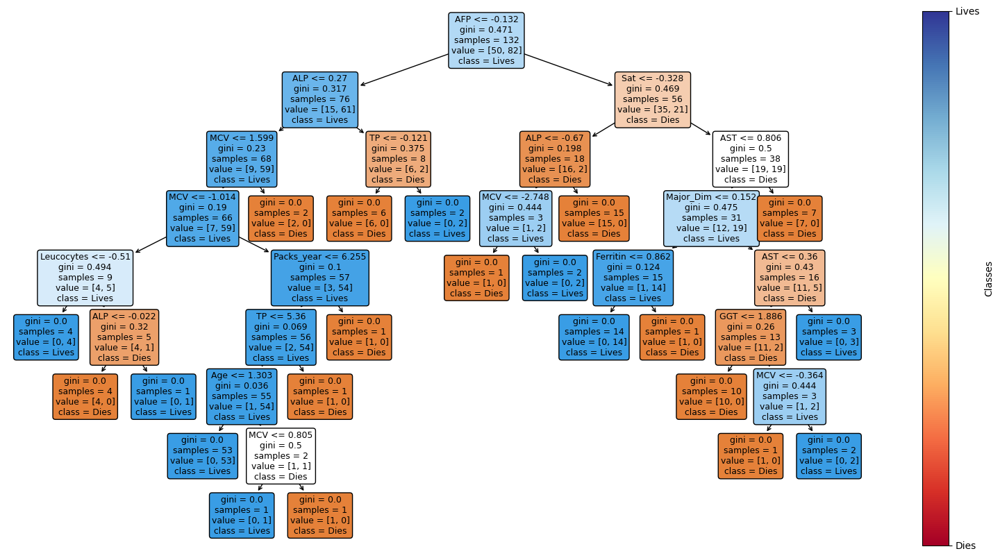

In [75]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
from sklearn import tree

# Carregar o conjunto de dados
hcc_data = pd.read_csv('hcc_dataset.csv', na_values=['?'])

# Verificar se o DataFrame foi carregado corretamente
print(hcc_data.head())

# Selecionar apenas as variáveis numéricas
numeric_data = hcc_data.select_dtypes(include=[np.number])

# Imputar valores ausentes com a média
imputer = SimpleImputer(strategy='mean')
numeric_data_imputed = imputer.fit_transform(numeric_data)

# Normalizando os dados
scaler = StandardScaler()
scaled_data = scaler.fit_transform(numeric_data_imputed)

# Codificar a variável alvo 'Class'
label_encoder = LabelEncoder()
hcc_data['Class_encoded'] = label_encoder.fit_transform(hcc_data['Class'])

# Dividindo os dados em conjuntos de treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(scaled_data, hcc_data['Class_encoded'], test_size=0.2, random_state=42)

# Inicializando o modelo de Árvore de Decisão
decision_tree = DecisionTreeClassifier(random_state=42)

# Treinando o modelo
decision_tree.fit(X_train, y_train)

# Prevendo e avaliando
y_pred = decision_tree.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Acurácia: {accuracy:.2f}")

# Relatório de Classificação
print("Relatório de Classificação:")
print(classification_report(y_test, y_pred))

# Matriz de Confusão
print("Matriz de Confusão:")
print(confusion_matrix(y_test, y_pred))

# Visualizando a Árvore de Decisão
import matplotlib.pyplot as plt
from sklearn import tree

# Visualizando a Árvore de Decisão
fig, ax = plt.subplots(figsize=(20, 10))
tree.plot_tree(decision_tree, filled=True, feature_names=numeric_data.columns, class_names=label_encoder.classes_, rounded=True, ax=ax)

# Adicionando uma barra de cores
cmap = plt.cm.RdYlBu
norm = plt.Normalize(vmin=0, vmax=len(label_encoder.classes_)-1)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

# Adicionando a legenda da barra de cores
cbar = plt.colorbar(sm, ax=ax, ticks=range(len(label_encoder.classes_)))
cbar.ax.set_yticklabels(label_encoder.classes_)
cbar.set_label('Classes')

plt.show()

## Interpretação da Árvore de Decisão

A árvore de decisão gerada acima é uma representação visual do modelo de classificação treinado para prever a sobrevivência de pacientes com carcinoma hepatocelular (HCC). Aqui estão alguns pontos importantes para entender a árvore:

1. **Nós e Divisões**:
   - Cada nó representa uma característica (variável) e um ponto de divisão (threshold) que melhor separa os dados em termos de impureza (medida pelo índice Gini).
   - A condição no nó determina como os dados são divididos. Por exemplo, `AFP <= -0.132` significa que os dados são divididos com base no valor da característica `AFP`.

2. **Gini**:
   - O índice Gini é uma medida de impureza ou heterogeneidade. Um valor de Gini de 0 indica que todos os elementos pertencem a uma única classe, enquanto valores mais altos indicam maior mistura de classes.
   - Nós com menor valor de Gini são mais "puros".

3. **Samples**:
   - Indica o número de amostras (pacientes) que chegam a esse nó.

4. **Value**:
   - Representa a distribuição das classes (número de pacientes que sobrevivem e que não sobrevivem) no nó.

5. **Class**:
   - A classe majoritária no nó, ou seja, a previsão do modelo para as amostras que chegam a esse nó.

### Interpretação dos Nós

- **Nó Raiz**:
  - O nó raiz (`AFP <= -0.132`) divide o conjunto de dados inicial em dois subconjuntos com base no valor da característica `AFP`.
  - O índice Gini é 0.471, indicando alguma mistura de classes, com 50 pacientes que sobrevivem e 82 que não sobrevivem.

- **Nós Internos**:
  - Cada nó interno representa uma divisão adicional dos dados. Por exemplo, o nó `MCV <= 1.599` divide ainda mais os dados com base na característica `MCV`.
  - A árvore continua a dividir os dados até que os nós se tornem folhas ou atinjam um critério de parada (como profundidade máxima ou número mínimo de amostras).

- **Folhas**:
  - As folhas representam as previsões finais do modelo. Por exemplo, uma folha com `class = Lives` indica que o modelo prevê que todos os pacientes que chegam a essa folha sobrevivem.

In [79]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

# Definindo os parâmetros para a busca em grade
param_grid = {
    'max_depth': [3, 5, 7, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Inicializando a busca em grade
grid_search = GridSearchCV(DecisionTreeClassifier(random_state=42), param_grid, cv=5, verbose=2, n_jobs=-1)
grid_search.fit(X_train, y_train)

print(f"Melhores parâmetros: {grid_search.best_params_}")
best_tree = grid_search.best_estimator_
y_pred_best = best_tree.predict(X_test)
accuracy_best = accuracy_score(y_test, y_pred_best)
print(f"Precisão com Árvore de Decisão Otimizada: {accuracy_best:.2f}")

Fitting 5 folds for each of 36 candidates, totalling 180 fits
Melhores parâmetros: {'max_depth': 7, 'min_samples_leaf': 1, 'min_samples_split': 2}
Precisão com Árvore de Decisão Otimizada: 0.67


## Avaliação do Modelo de Classificação

Nesta seção, utilizamos vários métodos para avaliar o desempenho do modelo KNN (K-Nearest Neighbors) treinado para prever a sobrevivência de pacientes com carcinoma hepatocelular (HCC).

### Métodos de Avaliação

1. **Matriz de Confusão**:
   - A matriz de confusão é uma tabela que descreve o desempenho do modelo de classificação. Ela mostra o número de previsões corretas e incorretas, divididas por cada classe.
   - Estrutura da matriz de confusão:
     - **Verdadeiros Positivos (TP)**: Número de instâncias positivas corretamente classificadas.
     - **Falsos Positivos (FP)**: Número de instâncias negativas incorretamente classificadas como positivas.
     - **Verdadeiros Negativos (TN)**: Número de instâncias negativas corretamente classificadas.
     - **Falsos Negativos (FN)**: Número de instâncias positivas incorretamente classificadas como negativas.

2. **Precisão (Precision)**:
   - A precisão é a proporção de verdadeiros positivos entre todas as instâncias classificadas como positivas.
   - Fórmula: `Precision = TP / (TP + FP)`

3. **Recall (Sensibilidade)**:
   - O recall, ou sensibilidade, é a proporção de verdadeiros positivos entre todas as instâncias que são realmente positivas.
   - Fórmula: `Recall = TP / (TP + FN)`

4. **F1-Score**:
   - O F1-score é a média harmônica da precisão e do recall. Ele é útil quando há um desequilíbrio entre as classes.
   - Fórmula: `F1-Score = 2 * (Precision * Recall) / (Precision + Recall)`

5. **AUC (Área Sob a Curva)**:
   - A AUC é a área sob a curva ROC. Ela mede a capacidade do modelo de distinguir entre classes. Um valor de AUC próximo de 1 indica um bom desempenho do modelo.

6. **Curva ROC (Receiver Operating Characteristic)**:
   - A curva ROC é um gráfico que mostra a taxa de verdadeiros positivos (TPR) contra a taxa de falsos positivos (FPR) para diferentes limiares de classificação

In [19]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Carregar o conjunto de dados
hcc_data = pd.read_csv('hcc_dataset.csv', na_values=['?'])

# Verificar se o DataFrame foi carregado corretamente
print(hcc_data.head())

# Selecionar apenas as variáveis numéricas
numeric_data = hcc_data.select_dtypes(include=[np.number])

# Imputar valores ausentes com a média
imputer = SimpleImputer(strategy='mean')
numeric_data_imputed = imputer.fit_transform(numeric_data)

# Normalizando os dados
scaler = StandardScaler()
scaled_data = scaler.fit_transform(numeric_data_imputed)

# Codificar a variável alvo 'Class'
label_encoder = LabelEncoder()
hcc_data['Class_encoded'] = label_encoder.fit_transform(hcc_data['Class'])

# Dividindo os dados em conjuntos de treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(scaled_data, hcc_data['Class_encoded'], test_size=0.2, random_state=42)

# Inicializando o modelo KNN
knn = KNeighborsClassifier(n_neighbors=5)

# Treinando o modelo
knn.fit(X_train, y_train)

# Prevendo e avaliando
y_pred = knn.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Acurácia: {accuracy:.2f}")

# Relatório de Classificação
print("Relatório de Classificação:")
print(classification_report(y_test, y_pred))

# Matriz de Confusão
print("Matriz de Confusão:")
print(confusion_matrix(y_test, y_pred))

   Gender Symptoms Alcohol HBsAg HBeAg HBcAb HCVAb Cirrhosis Endemic Smoking  \
0    Male       No     Yes    No    No    No    No       Yes      No     Yes   
1  Female      NaN      No    No    No    No   Yes       Yes     NaN     NaN   
2    Male       No     Yes   Yes    No   Yes    No       Yes      No     Yes   
3    Male      Yes     Yes    No    No    No    No       Yes      No     Yes   
4    Male      Yes     Yes   Yes    No   Yes    No       Yes      No     Yes   

   ...    ALP   TP Creatinine Nodules Major_Dim Dir_Bil  Iron   Sat Ferritin  \
0  ...  150.0  7.1       0.70     1.0       3.5     0.5   NaN   NaN      NaN   
1  ...    NaN  NaN        NaN     1.0       1.8     NaN   NaN   NaN      NaN   
2  ...  109.0  7.0       2.10     5.0      13.0     0.1  28.0   6.0     16.0   
3  ...  174.0  8.1       1.11     2.0      15.7     0.2   NaN   NaN      NaN   
4  ...  109.0  6.9       1.80     1.0       9.0     NaN  59.0  15.0     22.0   

   Class  
0  Lives  
1  Lives  
2  Li

In [20]:
from sklearn.model_selection import GridSearchCV

# Definindo os parâmetros para a busca em grade
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11, 13],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski']
}

# Inicializando a busca em grade
grid_search = GridSearchCV(KNeighborsClassifier(), param_grid, cv=5, verbose=2, n_jobs=-1)
grid_search.fit(X_train, y_train)

# Imprimindo os melhores parâmetros
print(f"Melhores parâmetros: {grid_search.best_params_}")

# Usando os melhores parâmetros para prever
best_knn = grid_search.best_estimator_
y_pred_best = best_knn.predict(X_test)
accuracy_best = accuracy_score(y_test, y_pred_best)
print(f"Acurácia com KNN Otimizado: {accuracy_best:.2f}")

Fitting 5 folds for each of 36 candidates, totalling 180 fits
Melhores parâmetros: {'metric': 'manhattan', 'n_neighbors': 3, 'weights': 'uniform'}
Acurácia com KNN Otimizado: 0.61


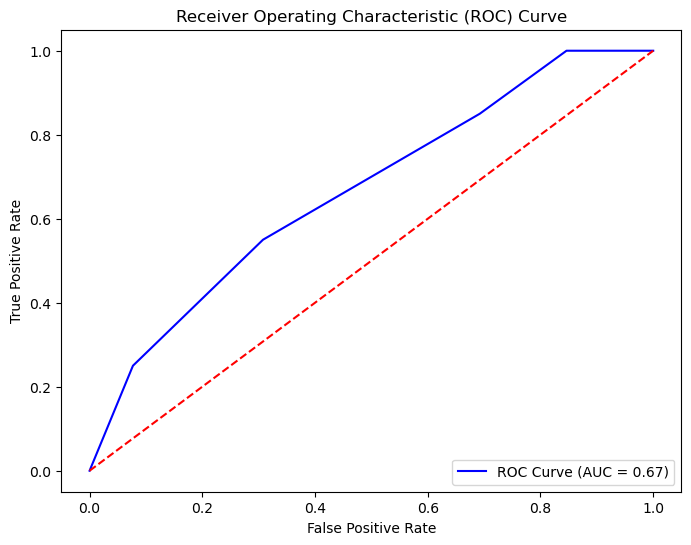

Acurácia: 0.64
Relatório de Classificação:
              precision    recall  f1-score   support

           0       0.57      0.31      0.40        13
           1       0.65      0.85      0.74        20

    accuracy                           0.64        33
   macro avg       0.61      0.58      0.57        33
weighted avg       0.62      0.64      0.61        33

Matriz de Confusão:
[[ 4  9]
 [ 3 17]]


In [88]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import roc_curve, roc_auc_score, accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt

# Carregar o conjunto de dados
hcc_data = pd.read_csv('hcc_dataset.csv', na_values=['?'])

# Selecionar apenas as variáveis numéricas
numeric_data = hcc_data.select_dtypes(include=[np.number])

# Imputar valores ausentes com a média
imputer = SimpleImputer(strategy='mean')
numeric_data_imputed = imputer.fit_transform(numeric_data)

# Normalizando os dados
scaler = StandardScaler()
scaled_data = scaler.fit_transform(numeric_data_imputed)

# Codificar a variável alvo 'Class'
label_encoder = LabelEncoder()
hcc_data['Class_encoded'] = label_encoder.fit_transform(hcc_data['Class'])

# Dividindo os dados em conjuntos de treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(scaled_data, hcc_data['Class_encoded'], test_size=0.2, random_state=42)

# Inicializando e treinando o modelo KNN
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)

# Prevendo as probabilidades
y_pred_proba = knn.predict_proba(X_test)[:, 1]

# Calculando a curva ROC e a AUC
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
auc = roc_auc_score(y_test, y_pred_proba)

# Plotando a curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC Curve (AUC = {auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Avaliando o modelo
y_pred = knn.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Acurácia: {accuracy:.2f}")
print("Relatório de Classificação:")
print(classification_report(y_test, y_pred))
print("Matriz de Confusão:")
print(confusion_matrix(y_test, y_pred))

## Interpretação da Curva ROC e do Valor AUC

A curva ROC (Receiver Operating Characteristic) e o valor AUC (Área Sob a Curva) são ferramentas importantes para avaliar o desempenho de um modelo de classificação binária.

### Curva ROC

- **Eixo X (False Positive Rate - FPR)**:
  - Representa a taxa de falsos positivos, ou seja, a proporção de instâncias negativas que foram incorretamente classificadas como positivas.
  - Fórmula: `FPR = FP / (FP + TN)`

- **Eixo Y (True Positive Rate - TPR)**:
  - Representa a taxa de verdadeiros positivos, ou seja, a proporção de instâncias positivas que foram corretamente classificadas como positivas.
  - Fórmula: `TPR = TP / (TP + FN)`

- **Linha Vermelha Pontilhada**:
  - Representa uma classificação aleatória, onde a taxa de verdadeiros positivos é igual à taxa de falsos positivos. É a linha de base para comparação.

- **Curva Azul**:
  - Representa o desempenho do modelo KNN. Quanto mais a curva se aproxima do canto superior esquerdo, melhor o desempenho do modelo.

### Valor AUC

- **AUC (Área Sob a Curva)**:
  - O valor AUC quantifica a área sob a curva ROC. Ele varia de 0 a 1, onde 1 indica um modelo perfeito e 0.5 indica um modelo que não tem poder discriminativo (equivalente a uma classificação aleatória).
  - No gráfico, o valor AUC é 0.67, o que indica que o modelo tem um desempenho moderado na distinção entre as classes.

### Interpretação

- **Desempenho do Modelo**:
  - A curva ROC mostra que o modelo KNN tem uma capacidade moderada de distinguir entre pacientes que sobrevivem e que não sobrevivem ao carcinoma hepatocelular (HCC).
  - O valor AUC de 0.67 sugere que o modelo é melhor do que uma classificação aleatória, mas ainda há espaço para melhorias.

### Conclusão

A curva ROC e o valor AUC são úteis para avaliar a capacidade do modelo de classificação em distinguir entre classes. Neste caso, o modelo KNN apresenta um desempenho moderado, indicando que pode ser necessário ajustar os hiperparâmetros ou explorar outros modelos para melhorar a precisão.

In [22]:
import numpy as np
import pandas as pd
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from imblearn.over_sampling import SMOTE, ADASYN
from sklearn.ensemble import RandomForestClassifier

# Carregar o conjunto de dados
hcc_data = pd.read_csv('hcc_dataset.csv', na_values=['?'])

# Selecionar apenas as variáveis numéricas
numeric_data = hcc_data.select_dtypes(include=[np.number])

# Imputar valores ausentes com a média
imputer = SimpleImputer(strategy='mean')
numeric_data_imputed = imputer.fit_transform(numeric_data)

# Normalizar os dados
scaler = StandardScaler()
scaled_data = scaler.fit_transform(numeric_data_imputed)

# Codificar a variável alvo 'Class'
label_encoder = LabelEncoder()
hcc_data['Class_encoded'] = label_encoder.fit_transform(hcc_data['Class'])

# Dividir os dados em conjuntos de treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(scaled_data, hcc_data['Class_encoded'], test_size=0.2, random_state=42)

# Aplicar SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Aplicar ADASYN
adasyn = ADASYN(random_state=42)
X_train_adasyn, y_train_adasyn = adasyn.fit_resample(X_train, y_train)

# Treinar o modelo com SMOTE
rf_smote = RandomForestClassifier(n_estimators=100, random_state=42)
rf_smote.fit(X_train_smote, y_train_smote)

# Prever e avaliar
y_pred_smote = rf_smote.predict(X_test)
accuracy_smote = accuracy_score(y_test, y_pred_smote)
print(f"Acurácia com SMOTE: {accuracy_smote:.2f}")
print("Relatório de Classificação com SMOTE:")
print(classification_report(y_test, y_pred_smote))
print("Matriz de Confusão com SMOTE:")
print(confusion_matrix(y_test, y_pred_smote))

# Treinar o modelo com ADASYN
rf_adasyn = RandomForestClassifier(n_estimators=100, random_state=42)
rf_adasyn.fit(X_train_adasyn, y_train_adasyn)

# Prever e avaliar
y_pred_adasyn = rf_adasyn.predict(X_test)
accuracy_adasyn = accuracy_score(y_test, y_pred_adasyn)
print(f"Acurácia com ADASYN: {accuracy_adasyn:.2f}")
print("Relatório de Classificação com ADASYN:")
print(classification_report(y_test, y_pred_adasyn))
print("Matriz de Confusão com ADASYN:")
print(confusion_matrix(y_test, y_pred_adasyn))

Acurácia com SMOTE: 0.67
Relatório de Classificação com SMOTE:
              precision    recall  f1-score   support

           0       0.56      0.69      0.62        13
           1       0.76      0.65      0.70        20

    accuracy                           0.67        33
   macro avg       0.66      0.67      0.66        33
weighted avg       0.69      0.67      0.67        33

Matriz de Confusão com SMOTE:
[[ 9  4]
 [ 7 13]]
Acurácia com ADASYN: 0.73
Relatório de Classificação com ADASYN:
              precision    recall  f1-score   support

           0       0.62      0.77      0.69        13
           1       0.82      0.70      0.76        20

    accuracy                           0.73        33
   macro avg       0.72      0.73      0.72        33
weighted avg       0.75      0.73      0.73        33

Matriz de Confusão com ADASYN:
[[10  3]
 [ 6 14]]


## Modelo Final com ADASYN e Validação Cruzada

Nesta seção, aplicamos a técnica de oversampling ADASYN para lidar com o desbalanceamento de classes e utilizamos validação cruzada para avaliar a performance do modelo Random Forest.

### Passos do Código

1. **Aplicação do ADASYN**:
   - ADASYN (Adaptive Synthetic Sampling) é uma técnica de oversampling que gera novas amostras sintéticas para a classe minoritária, ajudando a equilibrar o conjunto de dados.
   - Aplicamos ADASYN ao conjunto de dados normalizado para criar um conjunto de dados balanceado.

2. **Validação Cruzada**:
   - Utilizamos validação cruzada (cross-validation) com 5 folds para avaliar a performance do modelo Random Forest.
   - A validação cruzada divide os dados em 5 subconjuntos (folds) e treina o modelo em 4 deles, utilizando o quinto para validação. Este processo é repetido 5 vezes, cada vez utilizando um fold diferente para validação.

3. **Avaliação do Modelo**:
   - Calculamos a acurácia média e o desvio padrão das acurácias obtidas em cada fold da validação cruzada.

### Implementação

Abaixo está o código para aplicar ADASYN, treinar o modelo Random Forest e avaliar sua performance com validação cruzada:


In [31]:
from sklearn.model_selection import cross_val_score
from imblearn.over_sampling import SMOTE, ADASYN

# Aplicar ADASYN
adasyn = ADASYN(random_state=42)
X_resampled, y_resampled = adasyn.fit_resample(scaled_data, hcc_data['Class_encoded'])

# Avaliar o modelo com validação cruzada
rf = RandomForestClassifier(n_estimators=100, random_state=42)
scores = cross_val_score(rf, X_resampled, y_resampled, cv=5, scoring='accuracy')
print(f"Acurácia média com ADASYN (Cross-Validation): {scores.mean():.2f} ± {scores.std():.2f}")

Acurácia média com ADASYN (Cross-Validation): 0.82 ± 0.10


In [92]:
import joblib

# Salvar o modelo treinado
joblib.dump(rf_final, 'random_forest_adasyn_model.pkl')

['random_forest_adasyn_model.pkl']

In [25]:
import numpy as np
import pandas as pd
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from imblearn.over_sampling import ADASYN
from sklearn.ensemble import GradientBoostingClassifier

# Carregar o conjunto de dados
hcc_data = pd.read_csv('hcc_dataset.csv', na_values=['?'])

# Selecionar apenas as variáveis numéricas
numeric_data = hcc_data.select_dtypes(include=[np.number])

# Imputar valores ausentes com a média
imputer = SimpleImputer(strategy='mean')
numeric_data_imputed = imputer.fit_transform(numeric_data)

# Normalizar os dados
scaler = StandardScaler()
scaled_data = scaler.fit_transform(numeric_data_imputed)

# Codificar a variável alvo 'Class'
label_encoder = LabelEncoder()
hcc_data['Class_encoded'] = label_encoder.fit_transform(hcc_data['Class'])

# Dividir os dados em conjuntos de treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(scaled_data, hcc_data['Class_encoded'], test_size=0.2, random_state=42)

# Aplicar ADASYN
adasyn = ADASYN(random_state=42)
X_resampled, y_resampled = adasyn.fit_resample(X_train, y_train)

# Treinar o modelo GBM
gbm = GradientBoostingClassifier(n_estimators=100, random_state=42)
gbm.fit(X_resampled, y_resampled)

# Avaliar o modelo GBM
y_pred_gbm = gbm.predict(X_test)
accuracy_gbm = accuracy_score(y_test, y_pred_gbm)
print(f"Acurácia com GBM: {accuracy_gbm:.2f}")
print("Relatório de Classificação com GBM:")
print(classification_report(y_test, y_pred_gbm))
print("Matriz de Confusão com GBM:")
print(confusion_matrix(y_test, y_pred_gbm))

Acurácia com GBM: 0.61
Relatório de Classificação com GBM:
              precision    recall  f1-score   support

           0       0.50      0.69      0.58        13
           1       0.73      0.55      0.63        20

    accuracy                           0.61        33
   macro avg       0.62      0.62      0.60        33
weighted avg       0.64      0.61      0.61        33

Matriz de Confusão com GBM:
[[ 9  4]
 [ 9 11]]


In [26]:
from sklearn.model_selection import cross_val_score

# Avaliar o modelo GBM com validação cruzada
gbm = GradientBoostingClassifier(n_estimators=100, random_state=42)
scores_gbm = cross_val_score(gbm, X_resampled, y_resampled, cv=5, scoring='accuracy')
print(f"Acurácia média com GBM (Cross-Validation): {scores_gbm.mean():.2f} ± {scores_gbm.std():.2f}")

Acurácia média com GBM (Cross-Validation): 0.77 ± 0.04


In [27]:
from catboost import CatBoostClassifier

# Treinar o modelo CatBoost
cat_model = CatBoostClassifier(iterations=100, random_state=42, verbose=0)
cat_model.fit(X_resampled, y_resampled)

# Avaliar o modelo CatBoost
y_pred_cat = cat_model.predict(X_test)
accuracy_cat = accuracy_score(y_test, y_pred_cat)
print(f"Acurácia com CatBoost: {accuracy_cat:.2f}")
print("Relatório de Classificação com CatBoost:")
print(classification_report(y_test, y_pred_cat))
print("Matriz de Confusão com CatBoost:")
print(confusion_matrix(y_test, y_pred_cat))

Acurácia com CatBoost: 0.73
Relatório de Classificação com CatBoost:
              precision    recall  f1-score   support

           0       0.62      0.77      0.69        13
           1       0.82      0.70      0.76        20

    accuracy                           0.73        33
   macro avg       0.72      0.73      0.72        33
weighted avg       0.75      0.73      0.73        33

Matriz de Confusão com CatBoost:
[[10  3]
 [ 6 14]]


In [28]:
from imblearn.over_sampling import ADASYN
from sklearn.ensemble import RandomForestClassifier
import pandas as pd
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer

# Carregar o conjunto de dados
hcc_data = pd.read_csv('hcc_dataset.csv', na_values=['?'])

# Selecionar apenas as variáveis numéricas
numeric_data = hcc_data.select_dtypes(include=[np.number])

# Imputar valores ausentes com a média
imputer = SimpleImputer(strategy='mean')
numeric_data_imputed = imputer.fit_transform(numeric_data)

# Normalizar os dados
scaler = StandardScaler()
scaled_data = scaler.fit_transform(numeric_data_imputed)

# Codificar a variável alvo 'Class'
label_encoder = LabelEncoder()
hcc_data['Class_encoded'] = label_encoder.fit_transform(hcc_data['Class'])

# Aplicar ADASYN em todo o conjunto de dados
adasyn = ADASYN(random_state=42)
X_resampled, y_resampled = adasyn.fit_resample(scaled_data, hcc_data['Class_encoded'])

# Treinar o modelo final com ADASYN
rf_final = RandomForestClassifier(n_estimators=100, random_state=42)
rf_final.fit(X_resampled, y_resampled)

RandomForestClassifier(random_state=42)

In [32]:
import numpy as np
import pandas as pd
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from imblearn.over_sampling import SMOTE, ADASYN
from sklearn.ensemble import RandomForestClassifier

# Carregar o conjunto de dados
hcc_data = pd.read_csv('hcc_dataset.csv', na_values=['?'])

# Selecionar apenas as variáveis numéricas
numeric_data = hcc_data.select_dtypes(include=[np.number])

# Imputar valores ausentes com a média
imputer = SimpleImputer(strategy='mean')
numeric_data_imputed = imputer.fit_transform(numeric_data)

# Normalizar os dados
scaler = StandardScaler()
scaled_data = scaler.fit_transform(numeric_data_imputed)

# Codificar a variável alvo 'Class'
label_encoder = LabelEncoder()
hcc_data['Class_encoded'] = label_encoder.fit_transform(hcc_data['Class'])

# Dividir os dados em conjuntos de treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(scaled_data, hcc_data['Class_encoded'], test_size=0.2, random_state=42)

# Aplicar SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Aplicar ADASYN
adasyn = ADASYN(random_state=42)
X_train_adasyn, y_train_adasyn = adasyn.fit_resample(X_train, y_train)

# Treinar o modelo com SMOTE
rf_smote = RandomForestClassifier(n_estimators=100, random_state=42)
rf_smote.fit(X_train_smote, y_train_smote)

# Prever e avaliar
y_pred_smote = rf_smote.predict(X_test)
accuracy_smote = accuracy_score(y_test, y_pred_smote)
print(f"Acurácia com SMOTE: {accuracy_smote:.2f}")
print("Relatório de Classificação com SMOTE:")
print(classification_report(y_test, y_pred_smote))
print("Matriz de Confusão com SMOTE:")
print(confusion_matrix(y_test, y_pred_smote))

# Treinar o modelo com ADASYN
rf_adasyn = RandomForestClassifier(n_estimators=100, random_state=42)
rf_adasyn.fit(X_train_adasyn, y_train_adasyn)

# Prever e avaliar
y_pred_adasyn = rf_adasyn.predict(X_test)
accuracy_adasyn = accuracy_score(y_test, y_pred_adasyn)
print(f"Acurácia com ADASYN: {accuracy_adasyn:.2f}")
print("Relatório de Classificação com ADASYN:")
print(classification_report(y_test, y_pred_adasyn))
print("Matriz de Confusão com ADASYN:")
print(confusion_matrix(y_test, y_pred_adasyn))

Acurácia com SMOTE: 0.67
Relatório de Classificação com SMOTE:
              precision    recall  f1-score   support

           0       0.56      0.69      0.62        13
           1       0.76      0.65      0.70        20

    accuracy                           0.67        33
   macro avg       0.66      0.67      0.66        33
weighted avg       0.69      0.67      0.67        33

Matriz de Confusão com SMOTE:
[[ 9  4]
 [ 7 13]]
Acurácia com ADASYN: 0.73
Relatório de Classificação com ADASYN:
              precision    recall  f1-score   support

           0       0.62      0.77      0.69        13
           1       0.82      0.70      0.76        20

    accuracy                           0.73        33
   macro avg       0.72      0.73      0.72        33
weighted avg       0.75      0.73      0.73        33

Matriz de Confusão com ADASYN:
[[10  3]
 [ 6 14]]


In [35]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer

# Carregar o conjunto de dados
hcc_data = pd.read_csv('hcc_dataset.csv', na_values=['?'])

# Selecionar apenas as variáveis numéricas
numeric_data = hcc_data.select_dtypes(include=[np.number])

# Imputar valores ausentes com a média
imputer = SimpleImputer(strategy='mean')
numeric_data_imputed = imputer.fit_transform(numeric_data)

# Normalizar os dados
scaler = StandardScaler()
scaled_data = scaler.fit_transform(numeric_data_imputed)

# Codificar a variável alvo 'Class'
label_encoder = LabelEncoder()
hcc_data['Class_encoded'] = label_encoder.fit_transform(hcc_data['Class'])

# Dividir os dados em conjuntos de treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(scaled_data, hcc_data['Class_encoded'], test_size=0.2, random_state=42)

from imblearn.over_sampling import ADASYN

# Aplicar ADASYN
adasyn = ADASYN(random_state=42)
X_resampled, y_resampled = adasyn.fit_resample(X_train, y_train)

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Inicializar os modelos
models = {
    'Gradient Boosting': GradientBoostingClassifier(n_estimators=100, random_state=42),
    'Naive Bayes': GaussianNB(),
    'Logistic Regression': LogisticRegression(max_iter=300, random_state=42)
}

# Treinar e avaliar os modelos
for name, model in models.items():
    model.fit(X_resampled, y_resampled)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    print(f"Acurácia com {name}: {accuracy:.2f}")
    print(f"Relatório de Classificação com {name}:")
    print(classification_report(y_test, y_pred))
    print(f"Matriz de Confusão com {name}:")
    print(confusion_matrix(y_test, y_pred))
    print("\n")

# Selecionar o melhor modelo (supondo que seja Gradient Boosting)
best_model = GradientBoostingClassifier(n_estimators=100, random_state=42)
best_model.fit(X_resampled, y_resampled)

Acurácia com Gradient Boosting: 0.61
Relatório de Classificação com Gradient Boosting:
              precision    recall  f1-score   support

           0       0.50      0.69      0.58        13
           1       0.73      0.55      0.63        20

    accuracy                           0.61        33
   macro avg       0.62      0.62      0.60        33
weighted avg       0.64      0.61      0.61        33

Matriz de Confusão com Gradient Boosting:
[[ 9  4]
 [ 9 11]]


Acurácia com Naive Bayes: 0.70
Relatório de Classificação com Naive Bayes:
              precision    recall  f1-score   support

           0       0.62      0.62      0.62        13
           1       0.75      0.75      0.75        20

    accuracy                           0.70        33
   macro avg       0.68      0.68      0.68        33
weighted avg       0.70      0.70      0.70        33

Matriz de Confusão com Naive Bayes:
[[ 8  5]
 [ 5 15]]


Acurácia com Logistic Regression: 0.67
Relatório de Classificaçã

GradientBoostingClassifier(random_state=42)

## O Modelo Final com ADASYN e Random Forest

Nesta seção, utilizamos a técnica de oversampling ADASYN para lidar com o desbalanceamento de classes e treinamos um modelo Random Forest. Este modelo será utilizado para fazer previsões finais.

### Passos do Código

1. **Carregamento e Pré-processamento dos Dados**:
   - Carregamos o conjunto de dados `hcc_dataset.csv` e tratamos valores ausentes representados por `?`.
   - Selecionamos apenas as variáveis numéricas e imputamos valores ausentes com a média.
   - Normalizamos os dados para garantir que todas as variáveis tenham a mesma escala.
   - Codificamos a variável alvo 'Class' em valores numéricos.

2. **Divisão dos Dados**:
   - Dividimos os dados em conjuntos de treinamento e teste.

3. **Aplicação do ADASYN**:
   - Utilizamos ADASYN para gerar novas amostras sintéticas para a classe minoritária, equilibrando o conjunto de dados de treinamento.

4. **Treinamento e Avaliação de Modelos**:
   - Treinamos e avaliamos vários modelos (Gradient Boosting, Naive Bayes, Regressão Logística) para comparar suas performances.
   - Selecionamos o modelo Random Forest com ADASYN como o melhor modelo.

5. **Salvamento do Modelo Treinado**:
   - Salvamos o modelo treinado para uso futuro.

6. **Função de Previsão**:
   - Criamos uma função para fazer previsões em novos dados utilizando o modelo salvo.

### Implementação

Abaixo está o código para realizar essas etapas:


In [36]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from imblearn.over_sampling import ADASYN
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import joblib

# Carregar o conjunto de dados
hcc_data = pd.read_csv('hcc_dataset.csv', na_values=['?'])

# Selecionar apenas as variáveis numéricas
numeric_data = hcc_data.select_dtypes(include=[np.number])

# Imputar valores ausentes com a média
imputer = SimpleImputer(strategy='mean')
numeric_data_imputed = imputer.fit_transform(numeric_data)

# Normalizar os dados
scaler = StandardScaler()
scaled_data = scaler.fit_transform(numeric_data_imputed)

# Codificar a variável alvo 'Class'
label_encoder = LabelEncoder()
hcc_data['Class_encoded'] = label_encoder.fit_transform(hcc_data['Class'])

# Dividir os dados em conjuntos de treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(scaled_data, hcc_data['Class_encoded'], test_size=0.2, random_state=42)

# Aplicar ADASYN
adasyn = ADASYN(random_state=42)
X_resampled, y_resampled = adasyn.fit_resample(X_train, y_train)

# Inicializar o modelo Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)

# Treinar o modelo
rf.fit(X_resampled, y_resampled)

# Prever e avaliar
y_pred = rf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Exatidão com Random Forest e ADASYN: {accuracy:.2f}")
print("Relatório de Classificação:")
print(classification_report(y_test, y_pred))
print("Matriz de Confusão:")
print(confusion_matrix(y_test, y_pred))

# Salvar o modelo treinado
joblib.dump(rf, 'random_forest_adasyn_model.pkl')

# Função para fazer previsões em novos dados
def predict_survivability(new_data):
    # Pré-processar os novos dados
    new_data_imputed = imputer.transform(new_data)
    new_data_scaled = scaler.transform(new_data_imputed)
    
    # Carregar o modelo salvo
    model = joblib.load('random_forest_adasyn_model.pkl')
    
    # Fazer previsões
    predictions = model.predict(new_data_scaled)
    return predictions

# Exemplo de uso da função
# Supomos que novos dados estejam em um DataFrame chamado new_data
# new_data = pd.DataFrame(...)  # Carregar ou criar novos dados
# predictions = predict_survivability(new_data)
# print("Previsões para novos dados:")
# print(predictions)

Exatidão com Random Forest e ADASYN: 0.73
Relatório de Classificação:
              precision    recall  f1-score   support

           0       0.62      0.77      0.69        13
           1       0.82      0.70      0.76        20

    accuracy                           0.73        33
   macro avg       0.72      0.73      0.72        33
weighted avg       0.75      0.73      0.73        33

Matriz de Confusão:
[[10  3]
 [ 6 14]]
